## Conditional Histograms (Single Exemplar Image)
create conditional histograms (filter image conditioned on another)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import scipy as scp
import os

import utils.pc_utils_pyramid as pc
import utils.distributions as dsts
import utils.imread_utils as imr
import utils.calc_entropy as cen
import utils.luminance as lum
import utils.conditional_hists as ch

import pyrtools as pt
import imp

%config InlineBackend.print_figure_kwargs = {'dpi' : 200} #plotting pretty

## Readin Images

In [2]:
p65folder = '/data/vision/torralba/datasets/places/places365_standard/places365standard_easyformat/'
imfolder = p65folder+'val/'
imname = 'Places365_val_'
crop_size = (512,512)

#make a data table to hold file info

# #get filenames
#filenames = pd.read_table(p65folder+'val.txt',sep=' ',header=None,names='filename')
#match category IDS to indoor/outdoor label
#colnames = ['category','category_ID']
#df_cat_cid = pd.read_table(p65folder+'categories.txt',sep=' ',header=None,names=colnames)
df = pd.read_table(p65folder+'val.txt',sep=' ',header=0,names=['filename'])
df['category'] = [os.path.split(d)[0].replace('val/','') for d in df['filename']]

#create one hot category indoor/outdoor/outdoornatural label for each category
df_cat_lab = pd.read_csv('/data/scratch/vasha/data/SceneHierarchy_Places365.csv', header=1)
df_cat_lab = df_cat_lab.iloc[:, 0:4] #don't need more specific than indoor/outdoor manmade/natural
df_cat_lab['category'] = [os.path.split(c)[-1].replace("'","") for c in df_cat_lab['category']]

df = pd.merge(df, df_cat_lab, how="left", on="category")
df = df.dropna(subset=['indoor', 'outdoor, natural', 'outdoor, man-made'], how='all')
#[df.replace("'","") for c in df['category']]

sizedataset = len(list(df['filename']))
#df

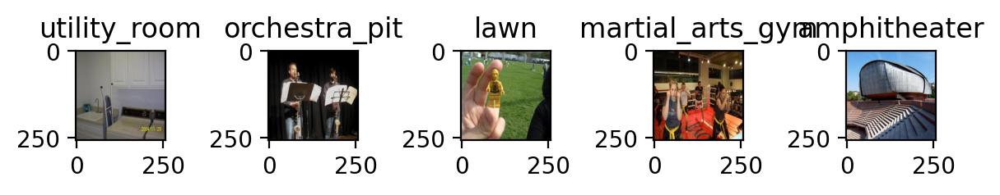

In [3]:
#plt.figure(figsize=(15,3))
nims = 50
cropsize = 256
#keep list
imlist = []
imlumlist = []
imlumcroplist = []
catlist = []

#show only a few
nims_show = 5

for idx in range(nims):
    imn = np.random.randint(0,sizedataset) #pick a random idx
    testim_fname = list(df['filename'])[imn]
    #testim_fname = imname+str(imn).zfill(8)+'.jpg'
    #print(testim_fname, p65folder)
    testim = imr.readin_im(testim_fname, p65folder)
    testim_cat = os.path.split(testim_fname)[0].replace('val/','')
    #testim_cat = df.loc[df['filename'] == testim_fname,'category'].item()
    imlist.append(testim)
    testimlum = lum.calc_lum_img(testim)
    imlumlist.append(testimlum)
    imlumcroplist.append(testimlum[:cropsize,:cropsize])
    catlist.append(testim_cat)
    #print(testim_cat)
    if(idx < nims_show):
        plt.subplot(1,nims_show,idx+1)
        plt.imshow(testim)
        plt.title(testim_cat)
plt.tight_layout()
plt.show()

## Make Pyramids

In [4]:
num_orientations=4 
num_levels=4
pyrlist = []

for img in imlumcroplist:
    img_pyr = pt.pyramids.SteerablePyramidFreq(img, order=num_orientations-1, is_complex=True, height=num_levels) #number of orientations is defined as order+1 in steerable pyramid source code
    pyrlist.append(img_pyr)

#pyr_height = int((len(img_pyr.pyr_size)-2)/(num_orientations+1))
pyr_height = num_levels

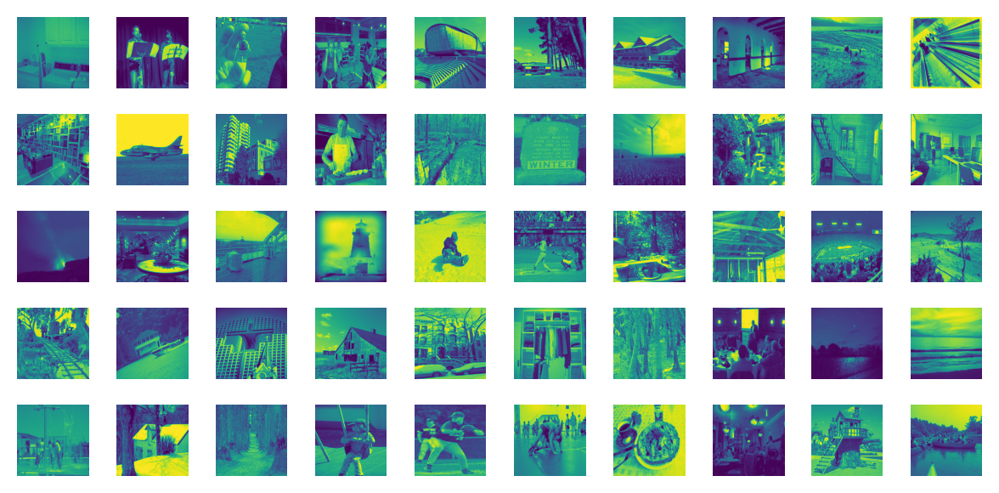

In [5]:
nrows=5
ncols=10
plt.figure(figsize=(6,3))
for i, img in enumerate(imlumcroplist):
    plt.subplot(5,10,i+1)
    plt.imshow(img)
    plt.axis('off')
plt.tight_layout()
plt.show()

# Butterfly Conditional Histograms

## Within Level, Cross Orientation Magtnitude (P&S 2000 stat)
"These represent structures in images e.g. edges, bars, corners and 'second order' textures"

Level 0 Magnitude
Averaged over 50 image pyramids
****************

<Figure size 432x288 with 0 Axes>

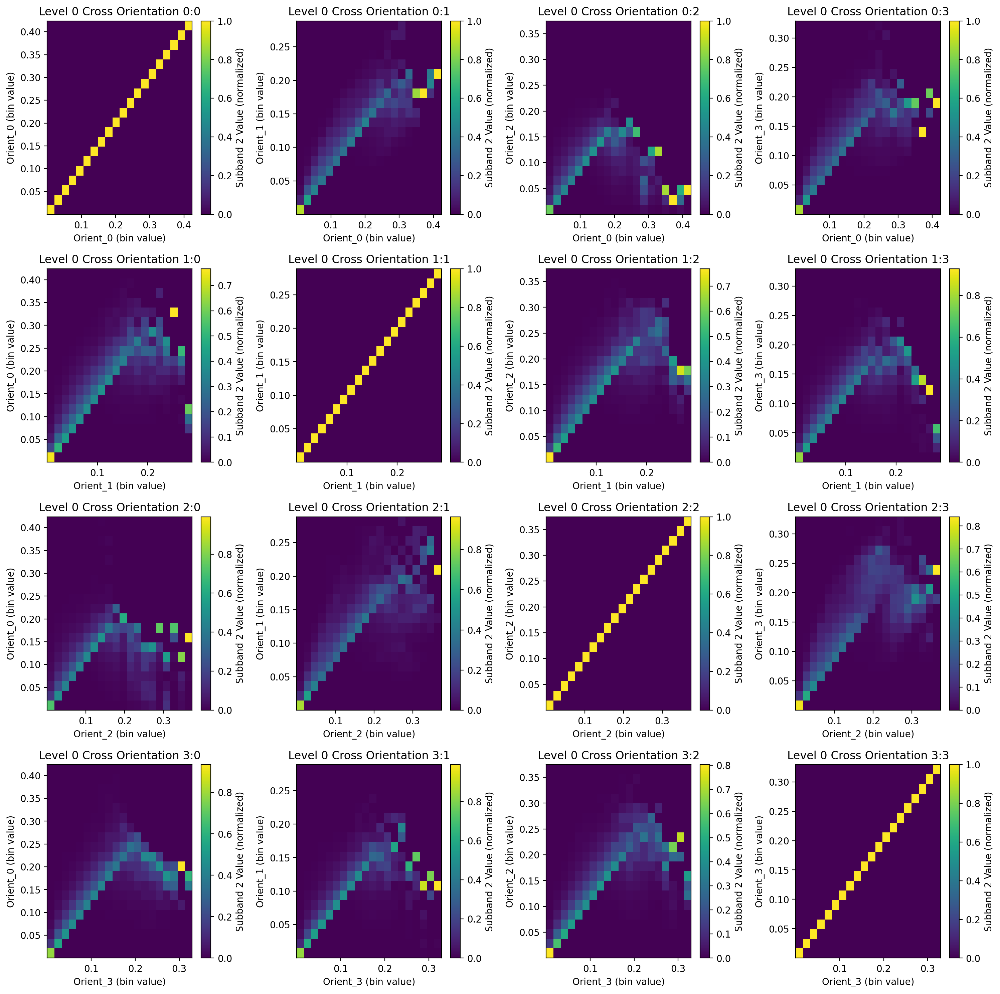

Level 1 Magnitude
Averaged over 50 image pyramids
****************

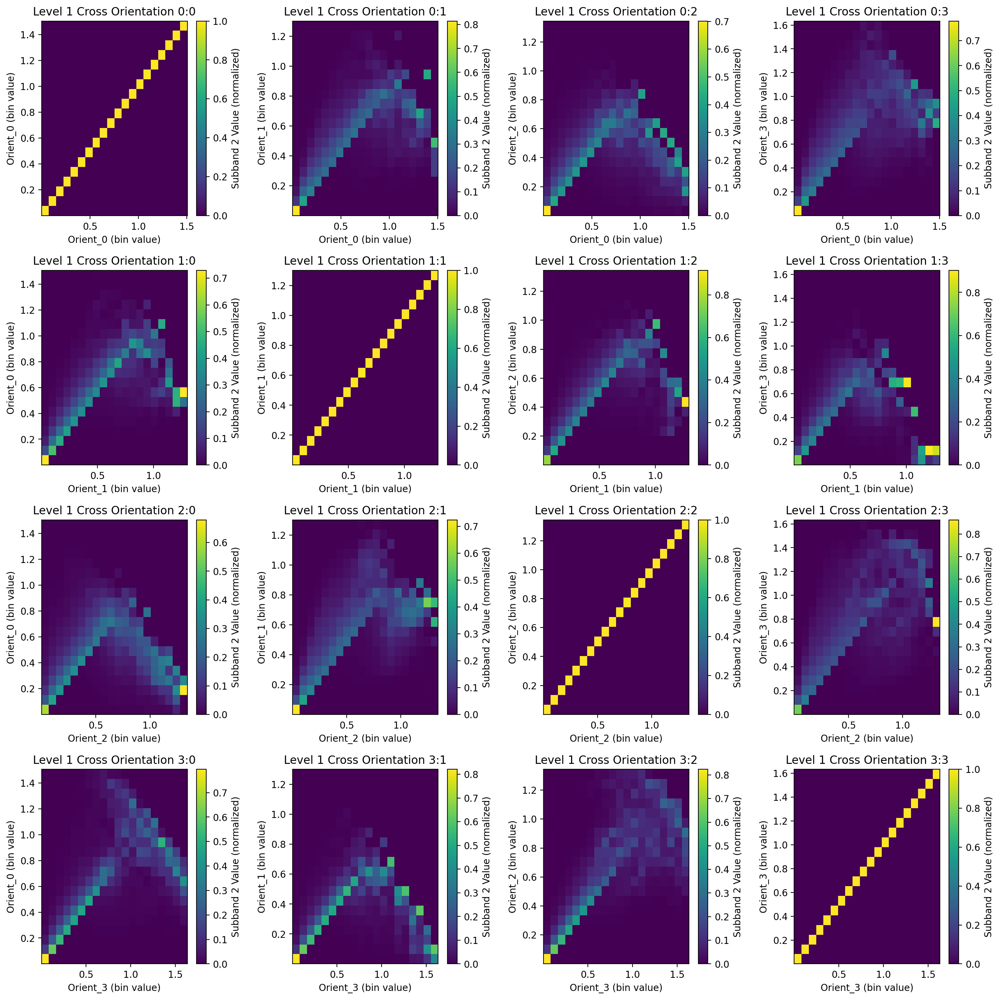

Level 2 Magnitude
Averaged over 50 image pyramids
****************

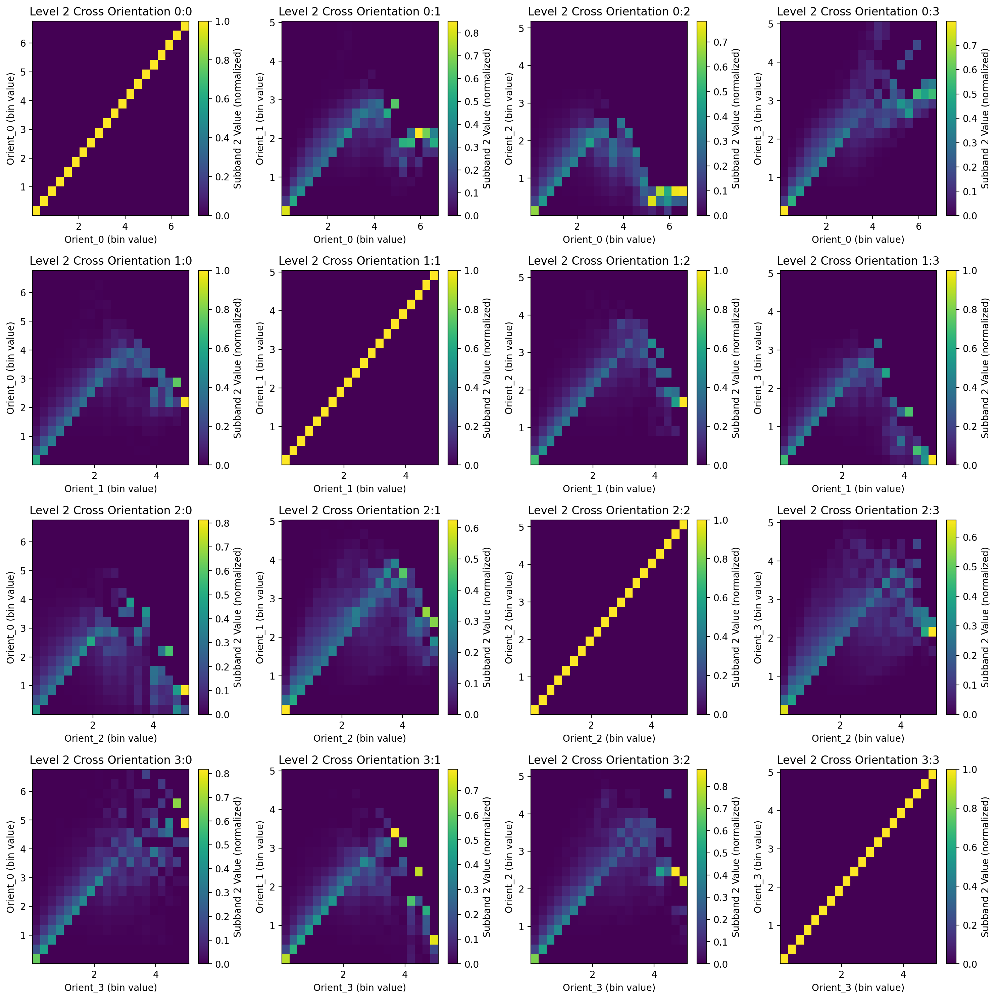

Level 3 Magnitude
Averaged over 50 image pyramids
****

/data/scratch/vasha/video_pyramids/utils/conditional_hists.py:162: RuntimeWarning: invalid value encountered in true_divide
  col = col / np.sum(col) #normalize such that total area =1


************

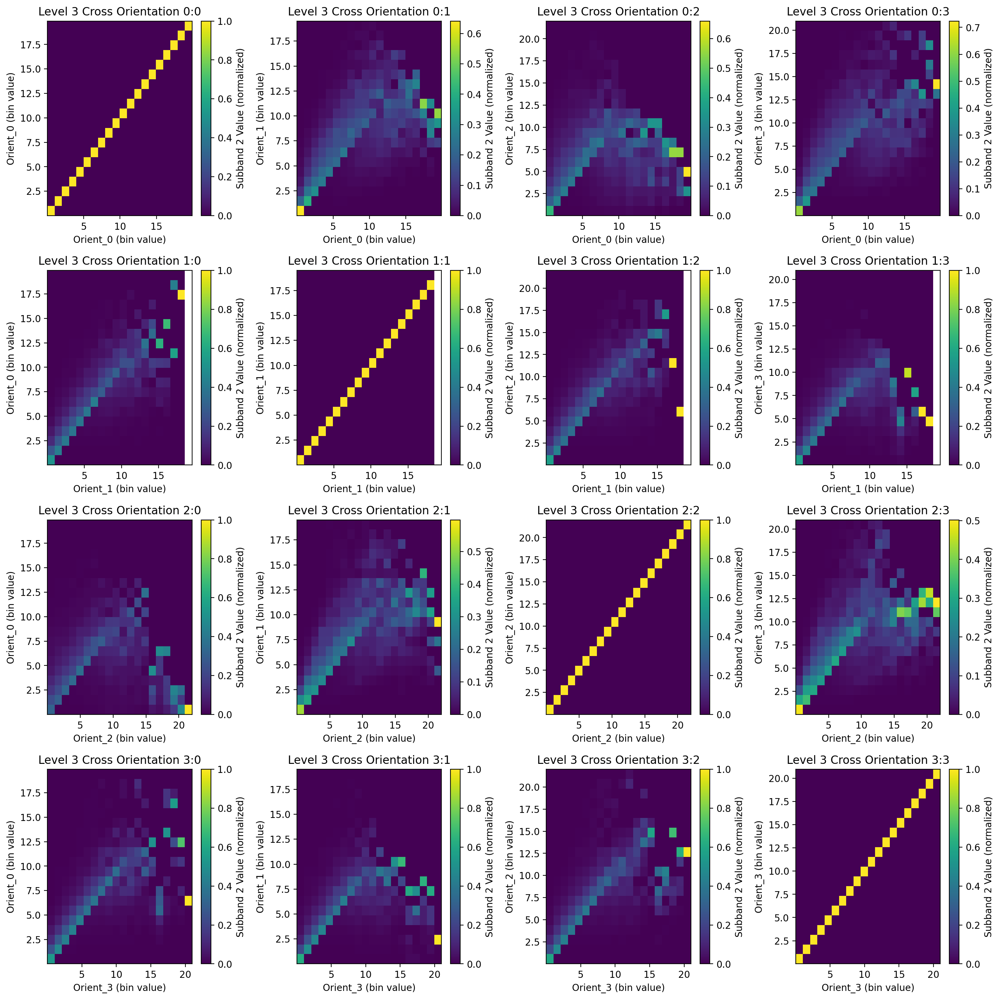

In [6]:
#Magnitude
plt.clf()
for level in range(pyr_height):
    print(f'Level {level} Magnitude')
    print(f'Averaged over {len(pyrlist)} image pyramids')
    plt.figure(figsize=(15,15))
    fignum=1
    for orient1 in range(num_orientations):
        for orient2 in range(num_orientations):
            subband1_list = []
            subband2_list = []
            band1_label=f'Orient_{orient1}'
            band2_label=f'Orient_{orient2}'
            #loop through same pyramids for each image in our dataset
            for img_pyr in pyrlist: 
                subband1_list.append(np.abs(img_pyr.pyr_coeffs[(level,orient1)]).flatten())
                subband2_list.append(np.abs(img_pyr.pyr_coeffs[(level,orient2)]).flatten())
            plt.subplot(num_orientations, num_orientations, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                       nbins=20,
                                                       make_plot=True,
                                                       showfig=False,
                                                       band1_label=band1_label,
                                                       band2_label=band2_label,
                                                       title_label=f'Level {level} Cross Orientation {orient1}:{orient2}',
                                                       pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()

## Within Orientation, Cross Level Magnitude (Only levels n cross n+1 included as P&S 2000 stats)
"These represent structures in images e.g. edges, bars, corners and 'second order' textures"

Orientation 0 Magnitude
Averaged over 50 image pyramids
****************

<Figure size 432x288 with 0 Axes>

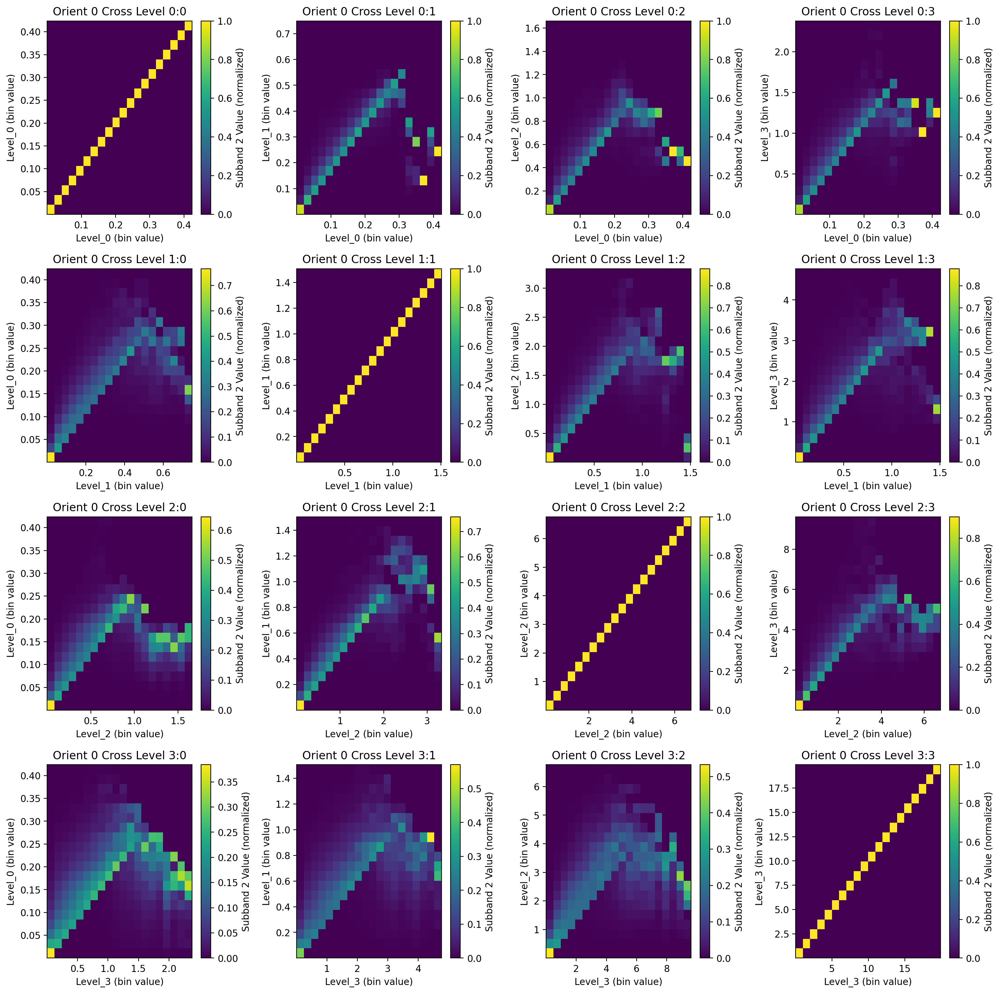

Orientation 1 Magnitude
Averaged over 50 image pyramids
****************

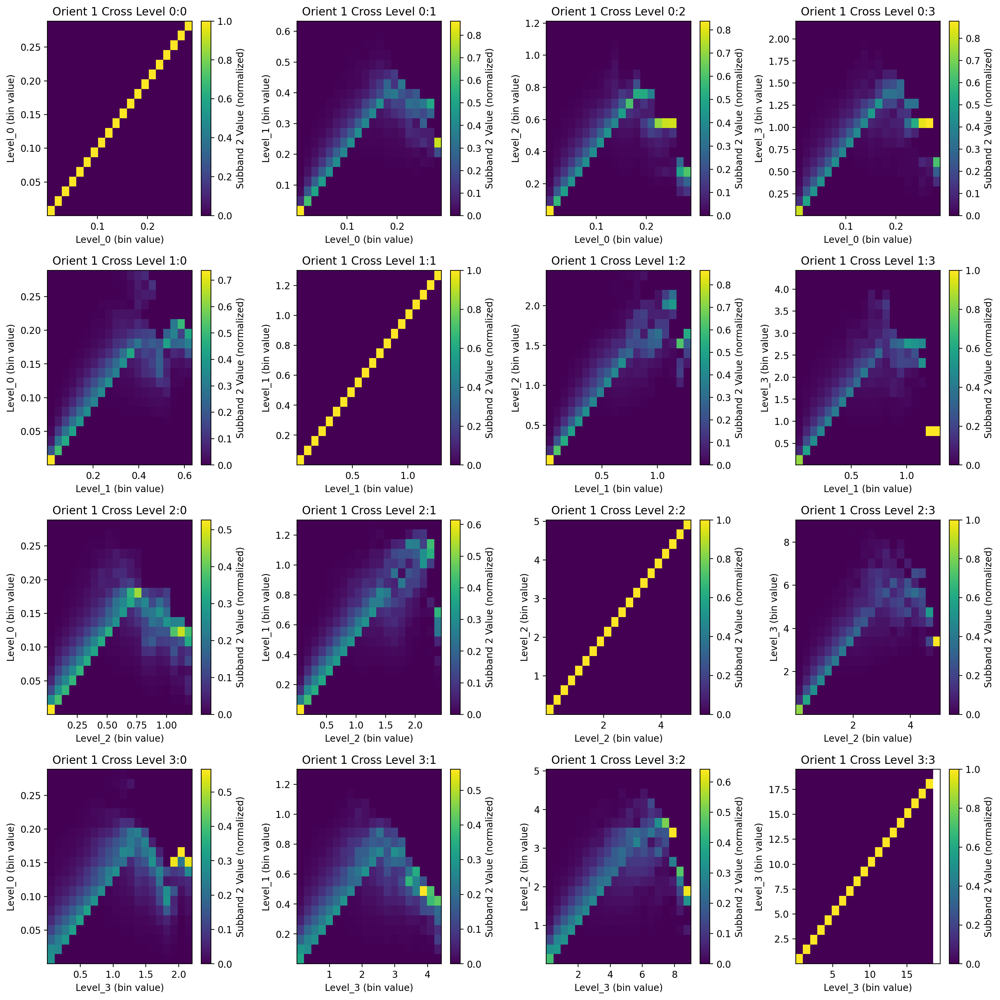

Orientation 2 Magnitude
Averaged over 50 image pyramids
****************

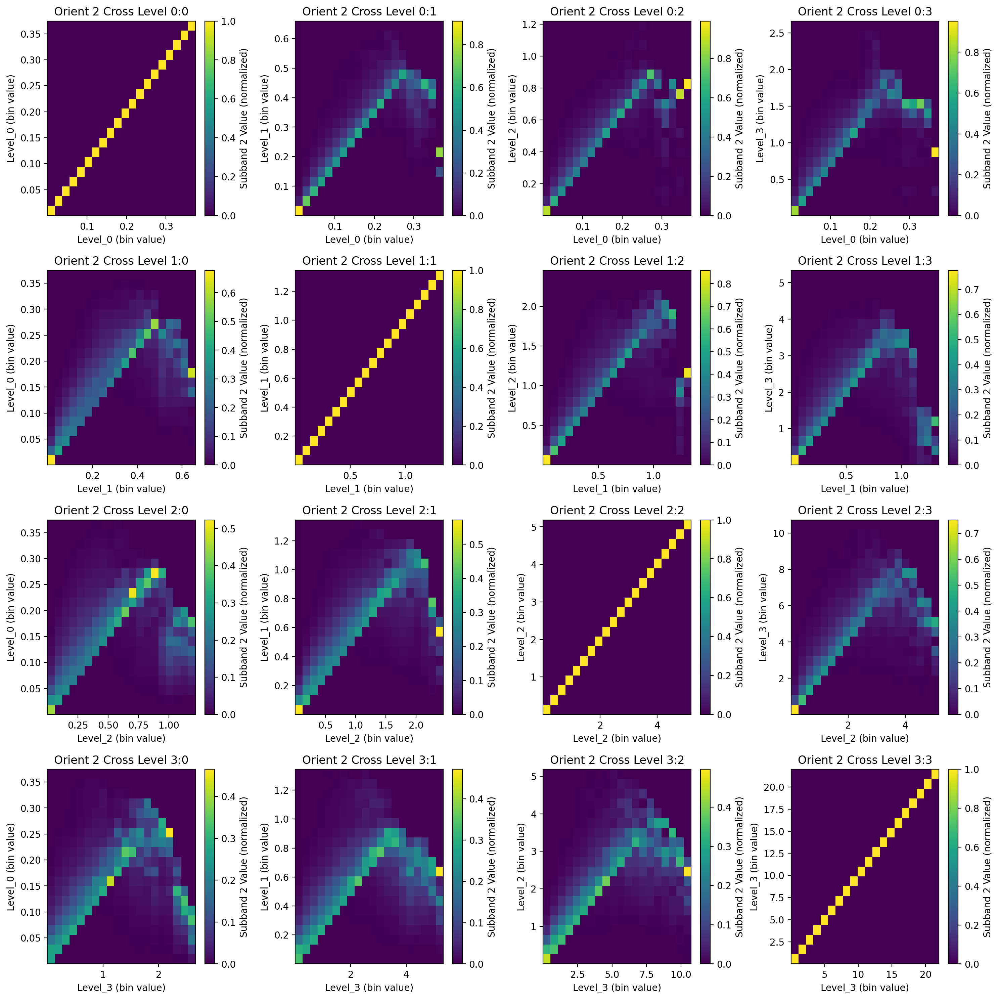

Orientation 3 Magnitude
Averaged over 50 image pyramids
****************

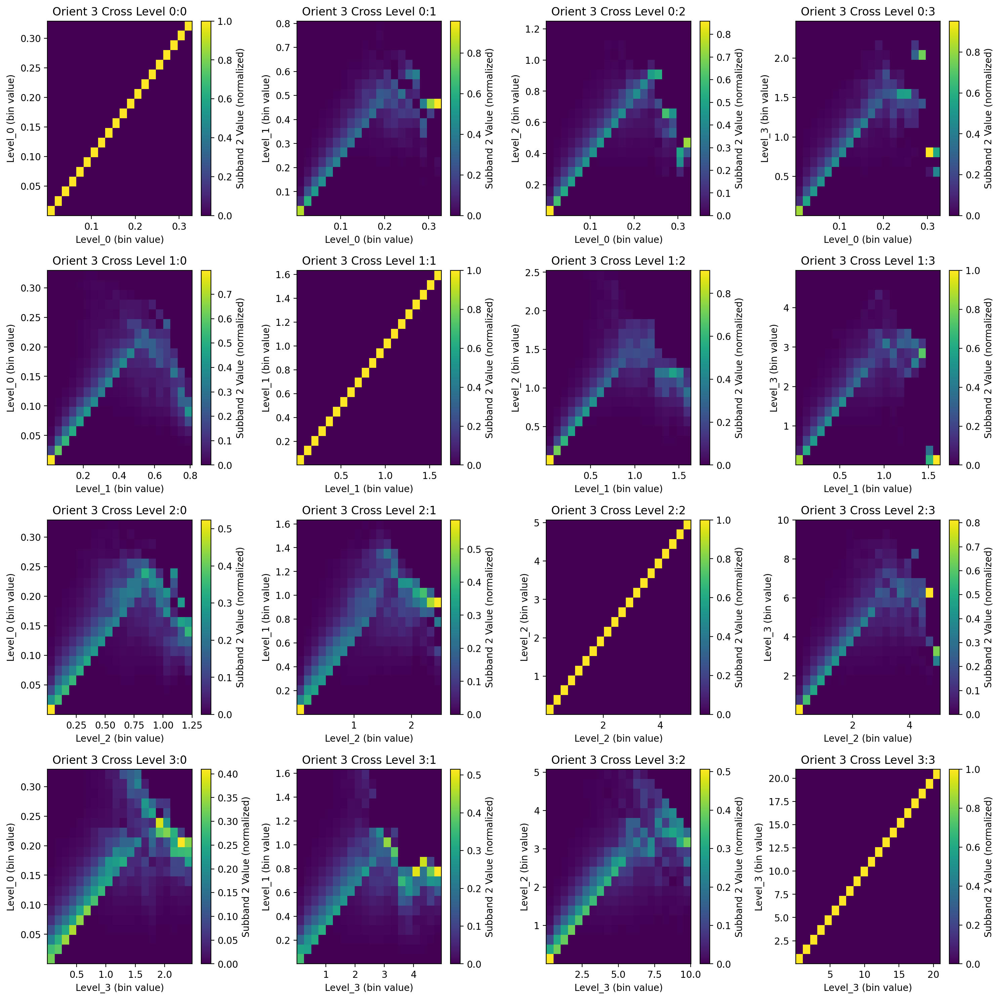

In [7]:
plt.clf()
imp.reload(ch)
#MAGNITUDE
for orient in range(num_orientations):
    print(f'Orientation {orient} Magnitude')
    print(f'Averaged over {len(pyrlist)} image pyramids')
    plt.figure(figsize=(15,15))
    fignum=1
    for level1 in range(num_levels):
        for level2 in range(num_levels):
            subband1_list = []
            subband2_list = []
            band1_label=f'Level_{level1}'
            band2_label=f'Level_{level2}'
            for img_pyr in pyrlist:
                subband1_list.append(np.abs(img_pyr.pyr_coeffs[(level1,orient)]))
                subband2_list.append(np.abs(img_pyr.pyr_coeffs[(level2,orient)]))
            plt.subplot(pyr_height, pyr_height, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                          nbins=20,
                                                           make_plot=True,
                                                           showfig=False,
                                                           band1_label=band1_label,
                                                           band2_label=band2_label,
                                                           title_label=f'Orient {orient} Cross Level {level1}:{level2}',
                                                           pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()


## Cross Orient Cross Scale n+1 Real  (NOT a P&S 2000 stat)

Levels 0 x 1 Real
Averaged over 50 image pyramids
****************

<Figure size 432x288 with 0 Axes>

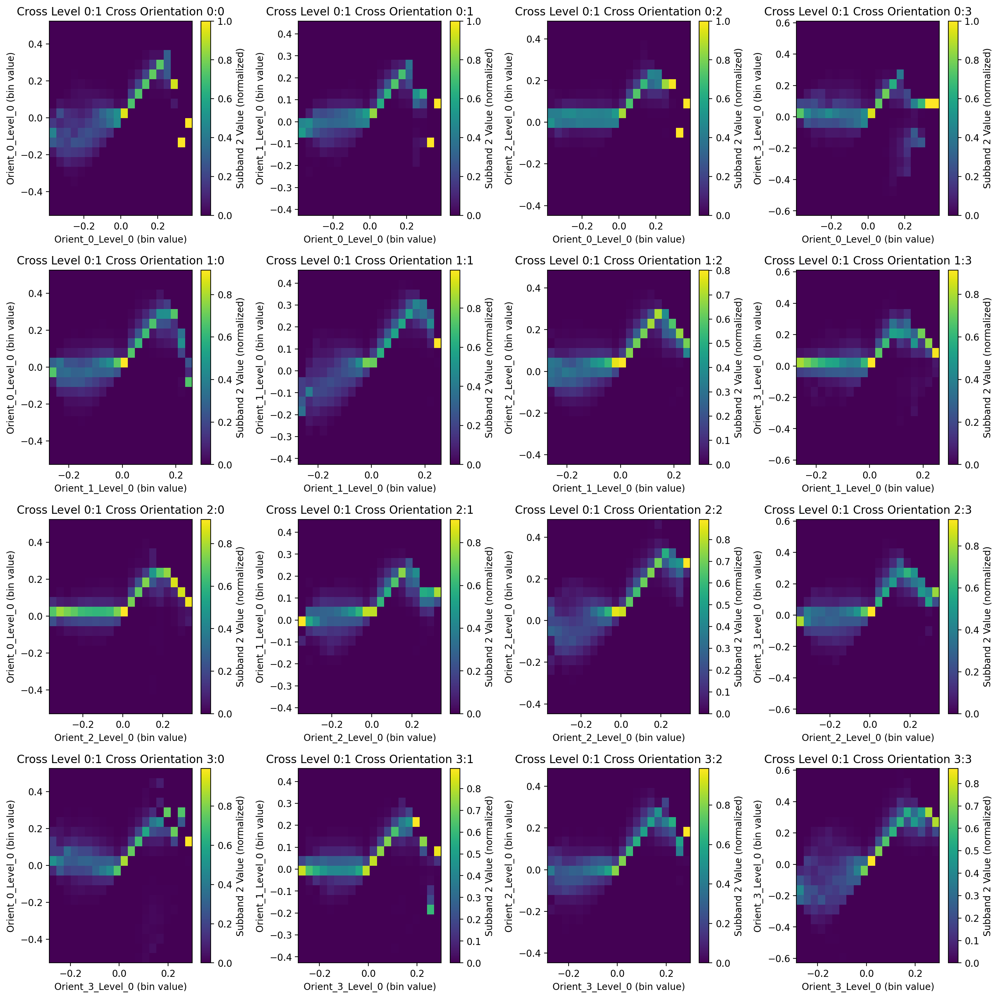

Levels 1 x 2 Real
Averaged over 50 image pyramids
****************

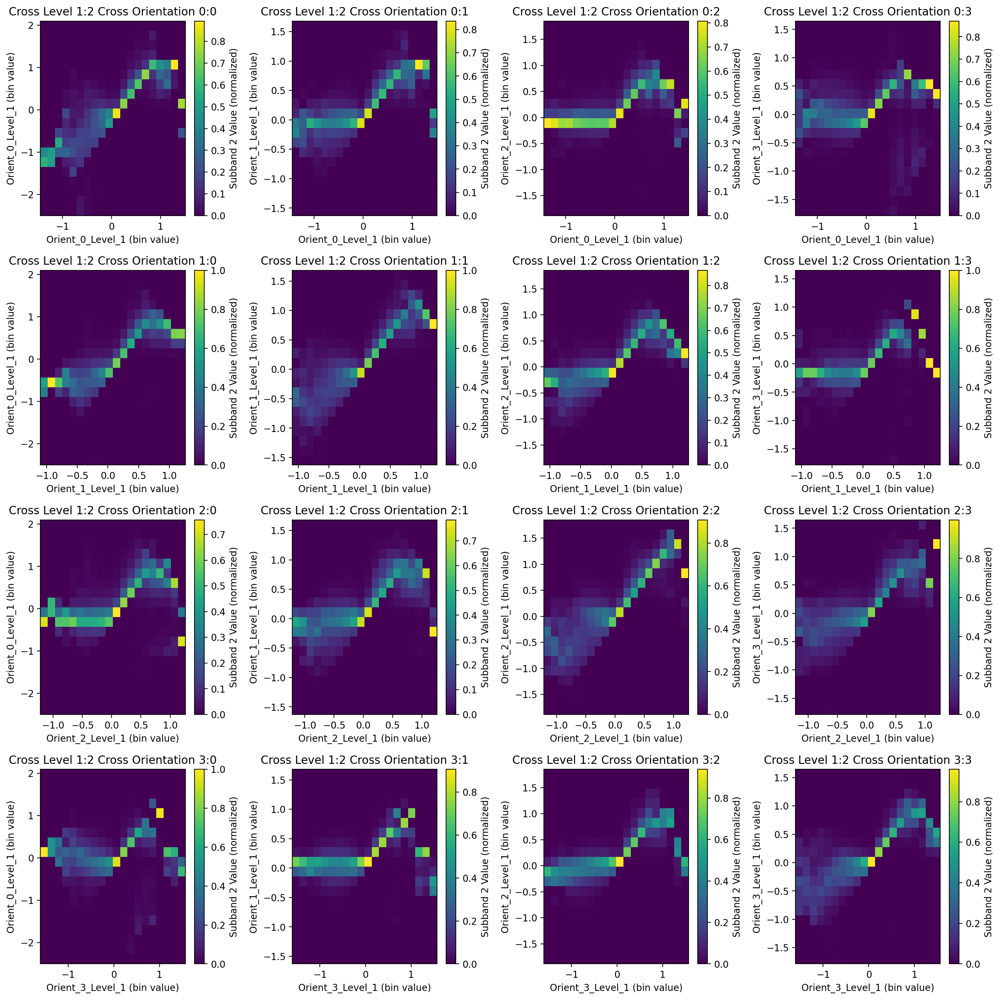

Levels 2 x 3 Real
Averaged over 50 image pyramids
****************

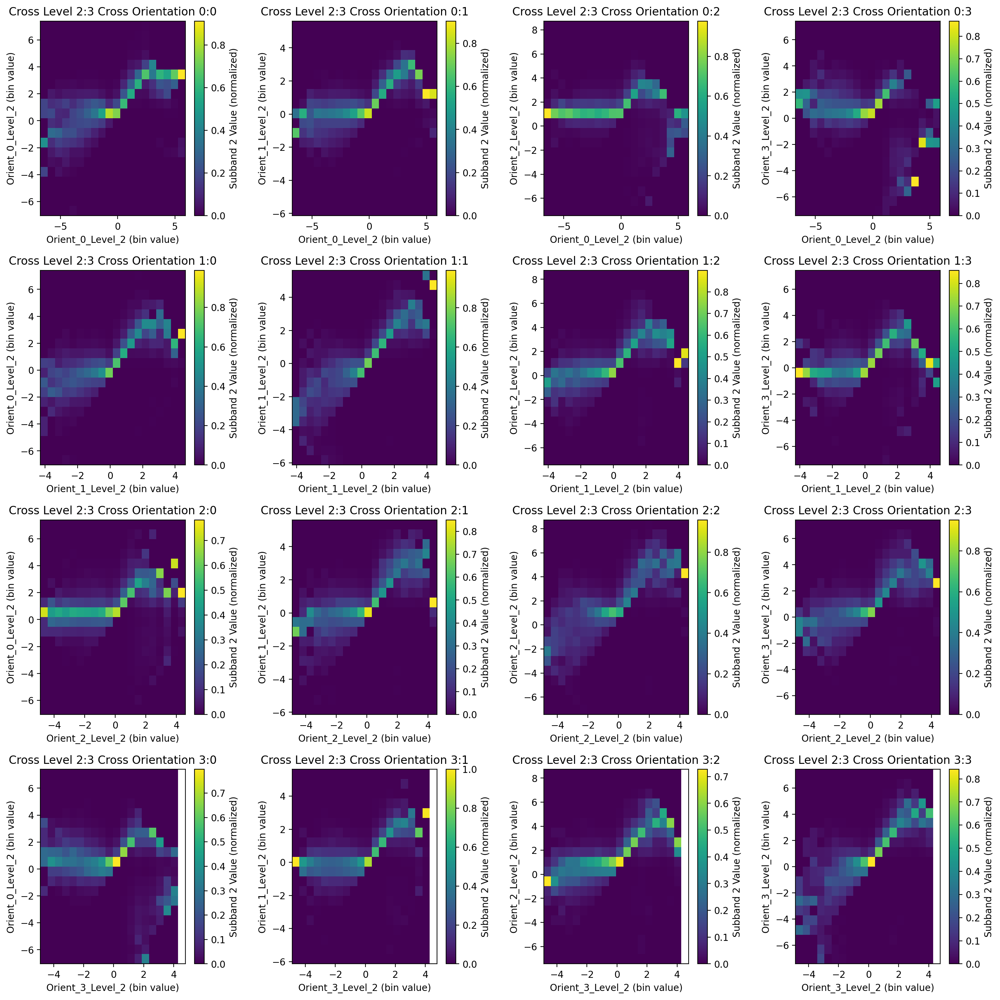

In [8]:
#Real
plt.clf()
for level1 in range(pyr_height-1):
    level2 = level1+1
    print(f'Levels {level1} x {level2} Real')
    print(f'Averaged over {len(pyrlist)} image pyramids')
    plt.figure(figsize=(15,15))
    fignum=1
    for orient1 in range(num_orientations):
        for orient2 in range(num_orientations):
            subband1_list = []
            subband2_list = []
            band1_label=f'Orient_{orient1}_Level_{level1}'
            band2_label=f'Orient_{orient2}_Level_{level1}'
            for img_pyr in pyrlist:
                #real
                subband1_list.append(np.real(img_pyr.pyr_coeffs[(level1,orient1)]))
                subband2_list.append(np.real(img_pyr.pyr_coeffs[(level2,orient2)]))
            plt.subplot(num_orientations, num_orientations, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                          nbins=20,
                                                           make_plot=True,
                                                           showfig=False,
                                                           band1_label=band1_label,
                                                           band2_label=band2_label,
                                                           title_label=f'Cross Level {level1}:{level2} Cross Orientation {orient1}:{orient2}',
                                                           pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()


## Within Orient Cross Scale n+1 Real Cross Real Phase Doubled (P&S 2000 stat)
"These distinguish edges from lines, and help in representing gradients due to shading and lighting effects"

Level 0:1 Cross Scale Phase Doubled Real
Averaged over 50 image pyramids


/data/scratch/vasha/anaconda3/lib/python3.9/site-packages/pyrtools/pyramids/c/wrapper.py:166: ComplexWarning: Casting complex values to real discards the imaginary part
  image = image.copy().astype(float)


****************

<Figure size 432x288 with 0 Axes>

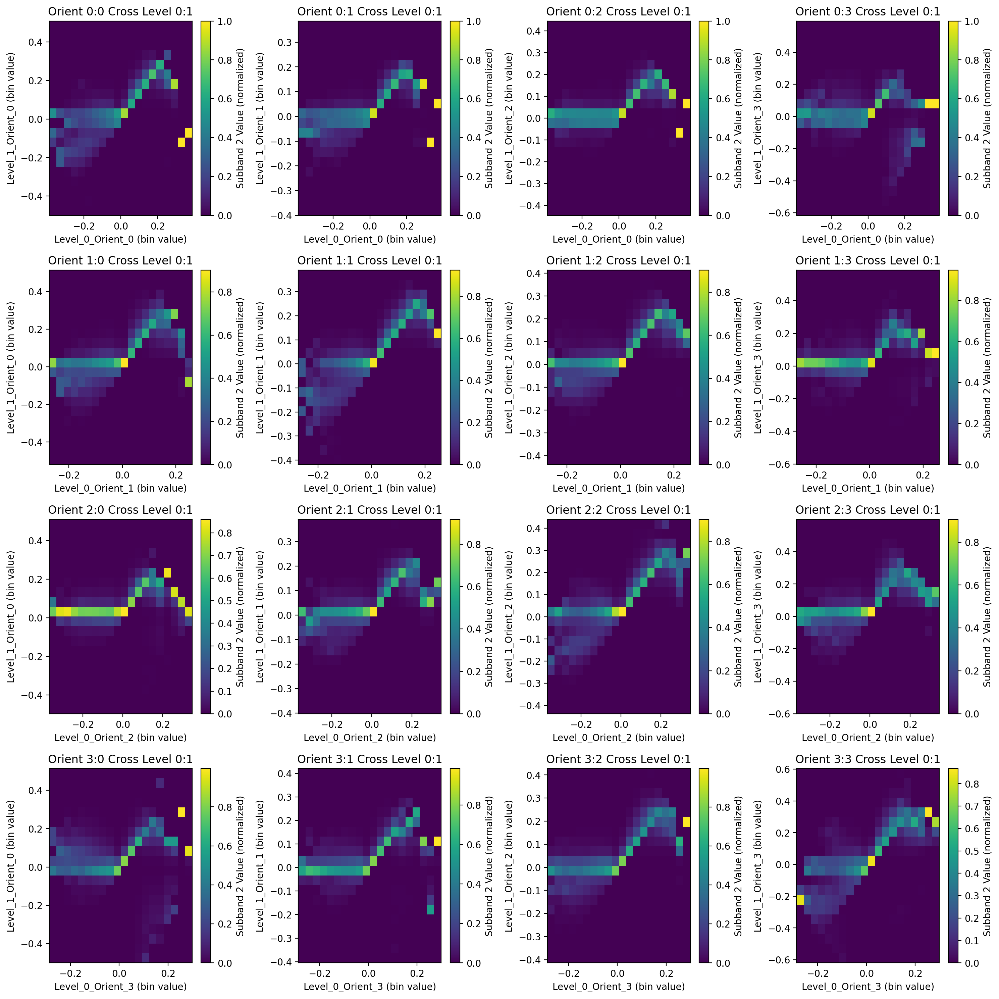

Level 1:2 Cross Scale Phase Doubled Real
Averaged over 50 image pyramids
****************

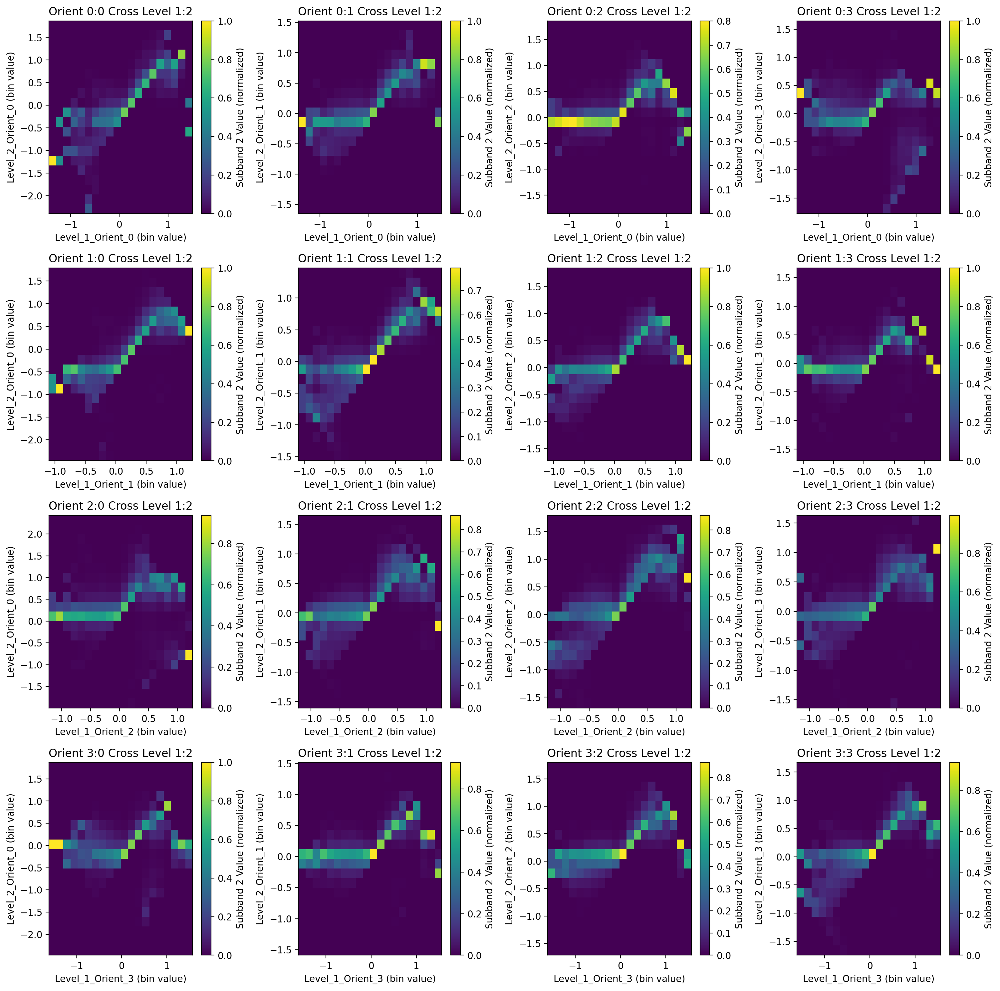

Level 2:3 Cross Scale Phase Doubled Real
Averaged over 50 image pyramids
****************

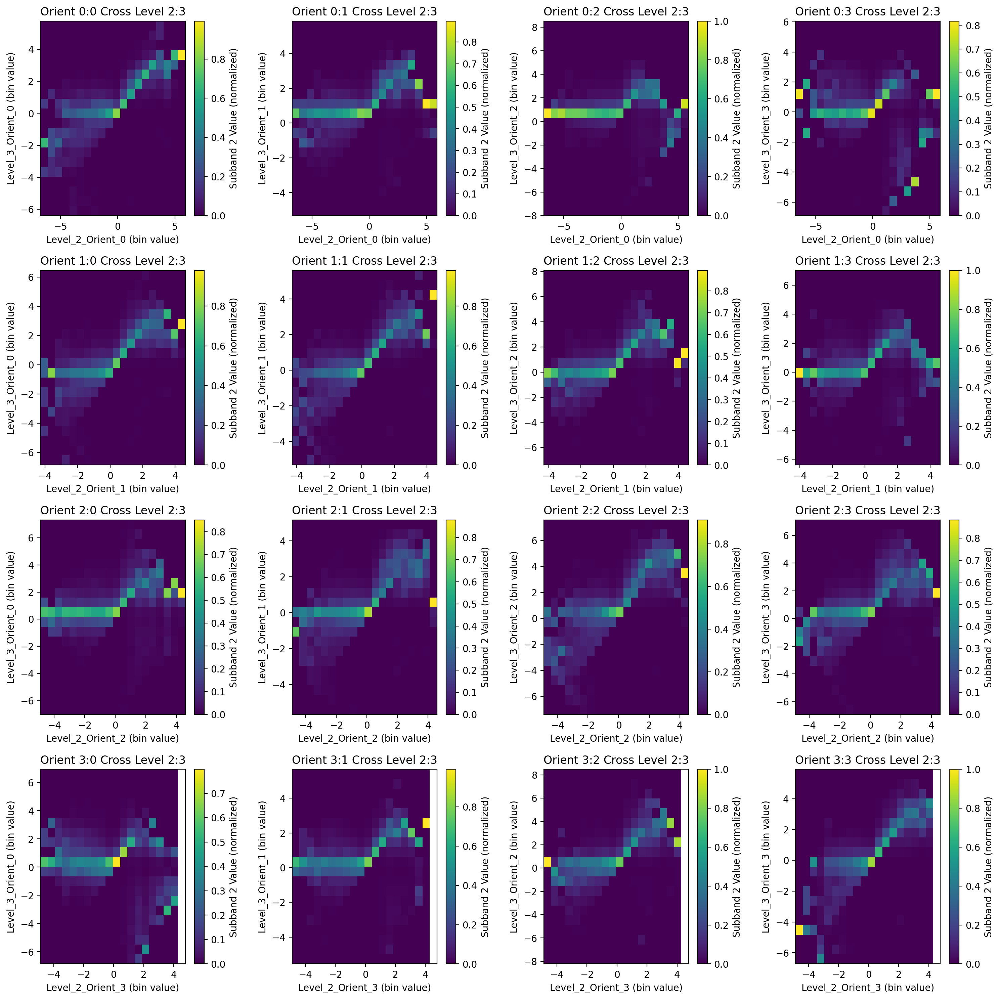

In [9]:
plt.clf()
imp.reload(ch)
for level1 in range(num_levels-1):
    level2 = level1+1
    print(f'Level {level1}:{level2} Cross Scale Phase Doubled Real')
    print(f'Averaged over {len(pyrlist)} image pyramids')
    plt.figure(figsize=(15,15))
    fignum=1
    for orient1 in range(num_orientations):
        for orient2 in range(num_orientations):
            subband1_list = []
            subband2_list = []
            band1_label=f'Level_{level1}_Orient_{orient1}'
            band2_label=f'Level_{level2}_Orient_{orient2}'
            for img_pyr in pyrlist:
                #extract complex filter
                s1 = img_pyr.pyr_coeffs[(level1,orient1)]
                subband1_list.append(np.real(s1)) #s1 is the real part
                s2_phase = 2 * np.angle(s1) #s2 has double the phase of s1
                s2 = img_pyr.pyr_coeffs[(level2,orient2)] #s2 has the magnitude of next coarser scale
                s2_mag = pt.tools.convolutions.upBlur(s2, n_levels=1)
                s2 = [mag * np.exp(1j*ang) for mag, ang in zip(s2_mag, s2_phase)]
                subband2_list.append(np.real(s2)) #real part
            plt.subplot(num_orientations, num_orientations, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                          nbins=20,
                                                           make_plot=True,
                                                           showfig=False,
                                                           band1_label=band1_label,
                                                           band2_label=band2_label,
                                                           title_label=f'Orient {orient1}:{orient2} Cross Level {level1}:{level2}',
                                                           pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()


## Within Orient Cross Scale n+1 Real Cross Imag Phase Doubled
"These distinguish edges from lines, and help in representing gradients due to shading and lighting effects"

Level 0:1 Cross Scale Phase Doubled Real
Averaged over 50 image pyramids
****************

<Figure size 432x288 with 0 Axes>

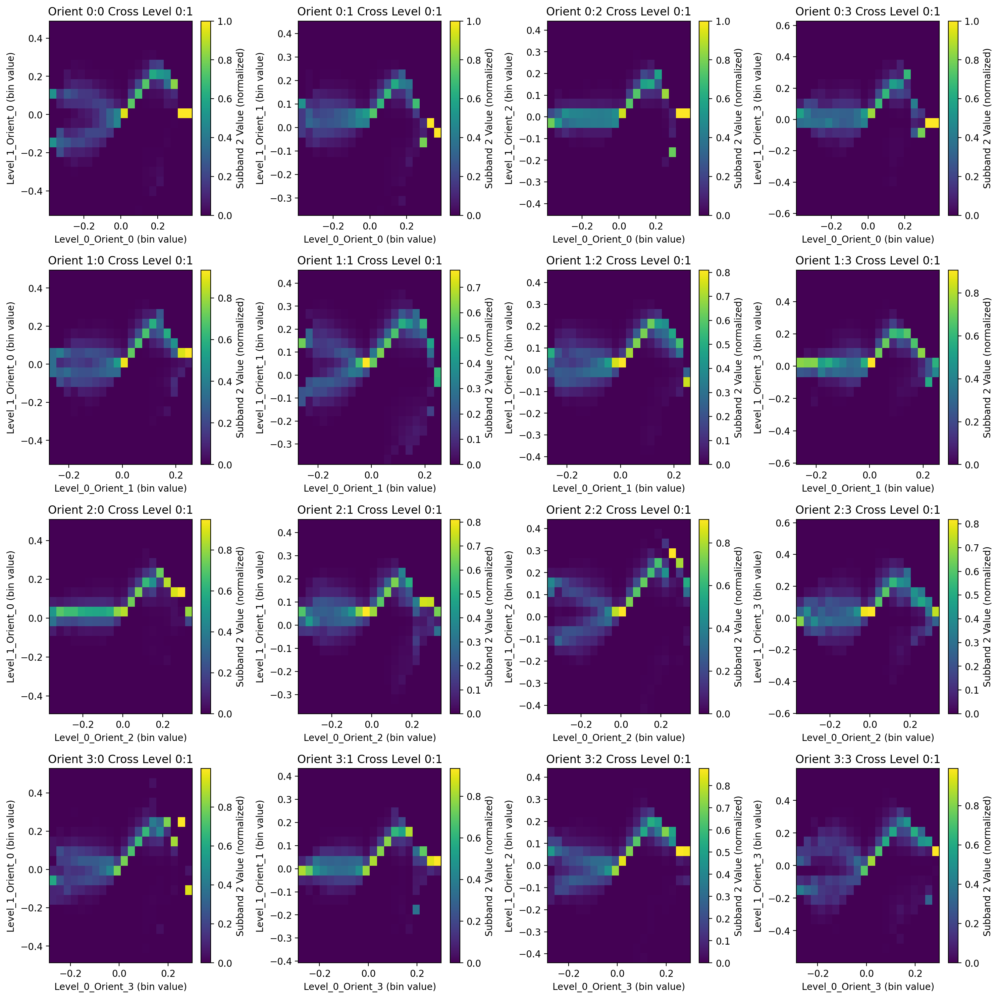

Level 1:2 Cross Scale Phase Doubled Real
Averaged over 50 image pyramids
****************

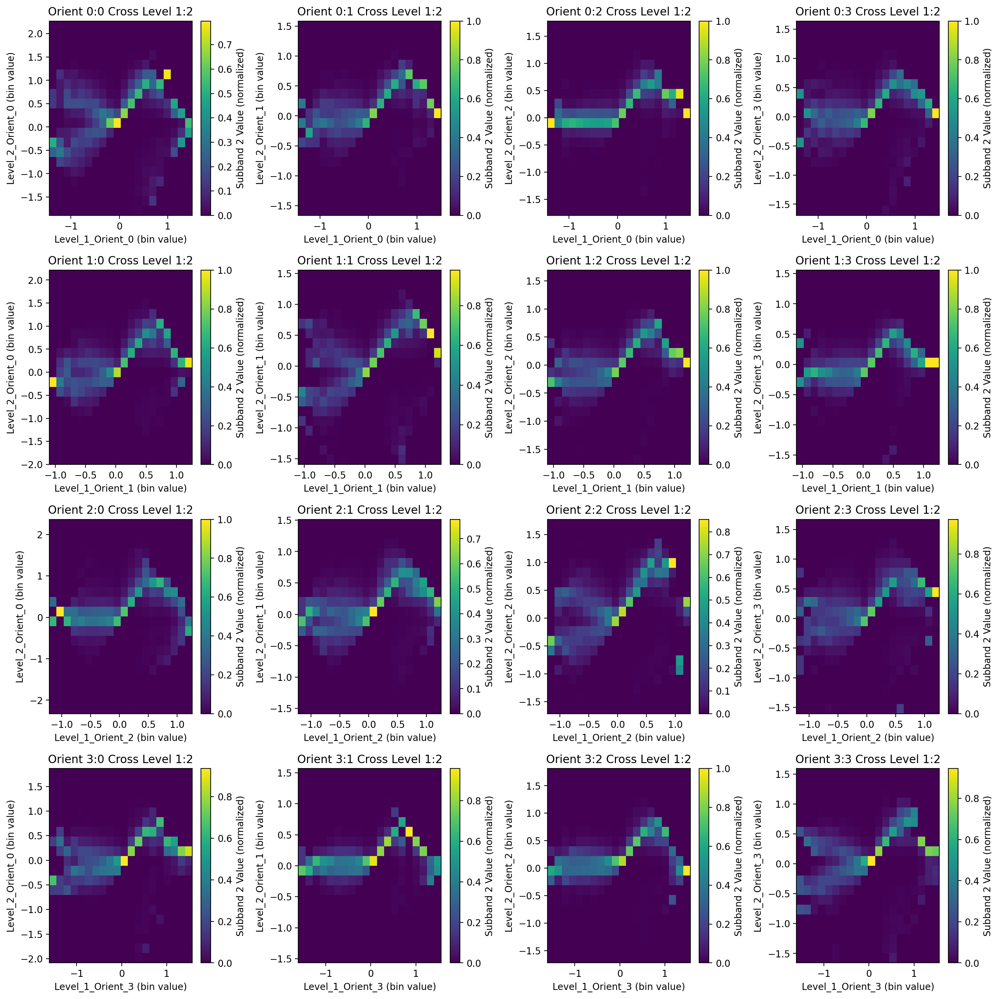

Level 2:3 Cross Scale Phase Doubled Real
Averaged over 50 image pyramids
****************

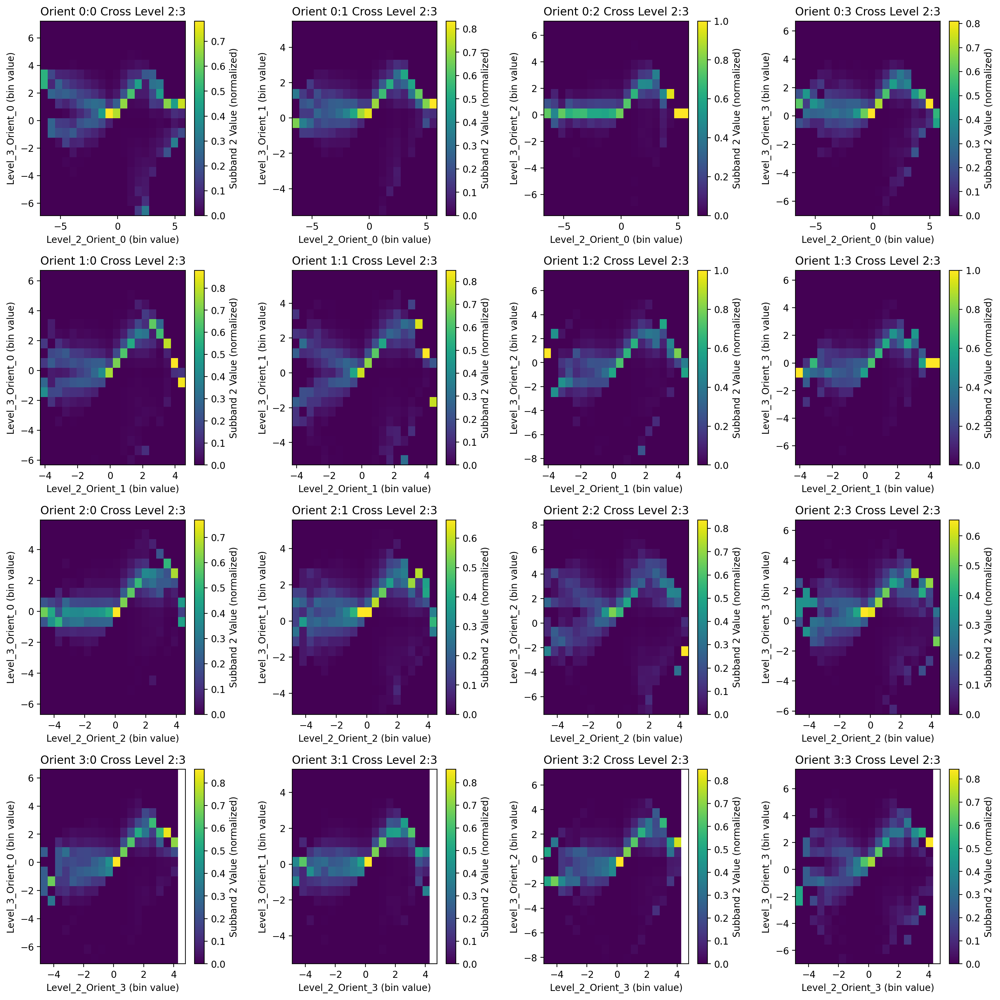

In [10]:
# plt.clf()
# imp.reload(ch)
# #MAGNITUDE
# for orient in range(num_orientations):
#     print(f'Orientation {orient} Cross Scale Phase Doubled Real')
#     print(f'Averaged over {len(pyrlist)} image pyramids')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for level1 in range(num_levels):
#         level2 = level1+1
#         subband1_list = []
#         subband2_list = []
#         band1_label=f'Level_{level1}'
#         band2_label=f'Level_{level2}'
#         for img_pyr in pyrlist:
#             #extract complex filter
#             s1 = img_pyr.pyr_coeffs[(level1,orient)]
#             subband1_list.append(np.real(s1)) #s1 is the real part
#             s2_phase = 2 * np.angle(s1) #s2 has double the phase of s1
#             s2 = img_pyr.pyr_coeffs[(level2,orient)] #s2 has the magnitude of next coarser scale
#             s2_mag = pt.tools.convolutions.upBlur(s2, n_levels=1)
#             s2 = [mag * np.exp(1j*ang) for mag, ang in zip(s2_mag, s2_phase)]
#             subband2_list.append(np.imag(s2)) #imag part
#         plt.subplot(pyr_height, pyr_height, fignum)
#         butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
#                                                       nbins=20,
#                                                        make_plot=True,
#                                                        showfig=False,
#                                                        band1_label=band1_label,
#                                                        band2_label=band2_label,
#                                                        title_label=f'Orient {orient} Cross Level {level1}:{level2}')
#         fignum+=1
#     plt.tight_layout()
#     plt.show()

plt.clf()
imp.reload(ch)
for level1 in range(num_levels-1):
    level2 = level1+1
    print(f'Level {level1}:{level2} Cross Scale Phase Doubled Real')
    print(f'Averaged over {len(pyrlist)} image pyramids')
    plt.figure(figsize=(15,15))
    fignum=1
    for orient1 in range(num_orientations):
        for orient2 in range(num_orientations):
            subband1_list = []
            subband2_list = []
            band1_label=f'Level_{level1}_Orient_{orient1}'
            band2_label=f'Level_{level2}_Orient_{orient2}'
            for img_pyr in pyrlist:
                #extract complex filter
                s1 = img_pyr.pyr_coeffs[(level1,orient1)]
                subband1_list.append(np.real(s1)) #s1 is the real part
                s2_phase = 2 * np.angle(s1) #s2 has double the phase of s1
                s2 = img_pyr.pyr_coeffs[(level2,orient2)] #s2 has the magnitude of next coarser scale
                s2_mag = pt.tools.convolutions.upBlur(s2, n_levels=1)
                s2 = [mag * np.exp(1j*ang) for mag, ang in zip(s2_mag, s2_phase)]
                subband2_list.append(np.imag(s2)) #imaginary part
            plt.subplot(num_orientations, num_orientations, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                          nbins=20,
                                                           make_plot=True,
                                                           showfig=False,
                                                           band1_label=band1_label,
                                                           band2_label=band2_label,
                                                           title_label=f'Orient {orient1}:{orient2} Cross Level {level1}:{level2}',
                                                           pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()


## Cross Orient Cross Scale n+1 Real Cross Imaginary (Not A P&S 2000 Stat)

Levels 0 x 1 Real x Imaginary
****************

<Figure size 432x288 with 0 Axes>

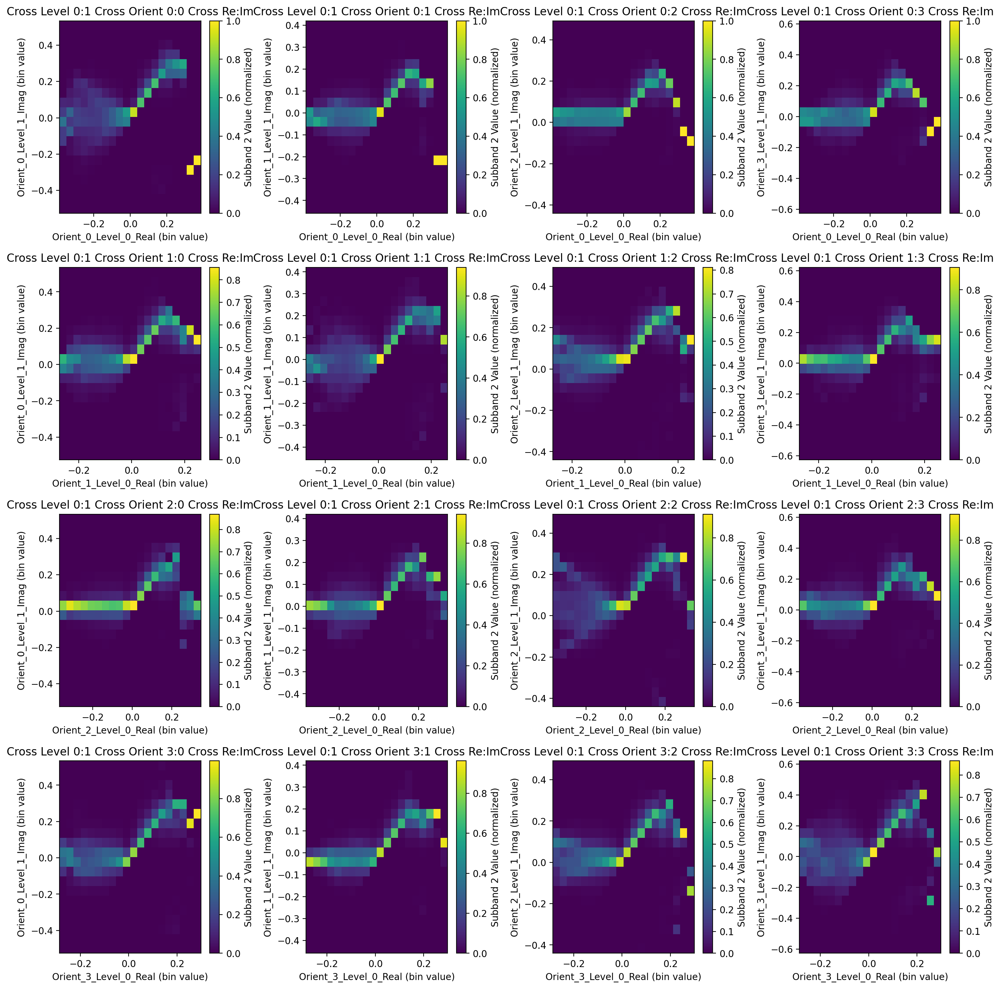

Levels 1 x 2 Real x Imaginary
****************

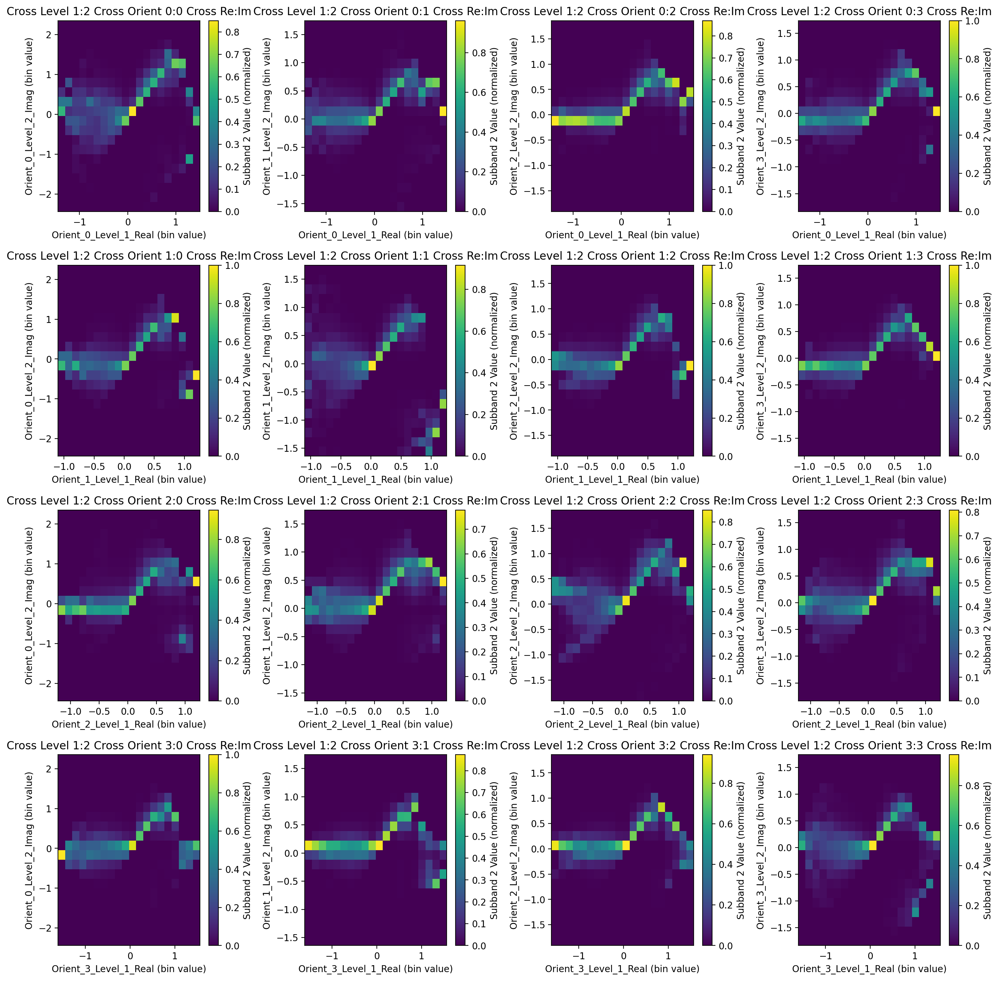

Levels 2 x 3 Real x Imaginary
****************

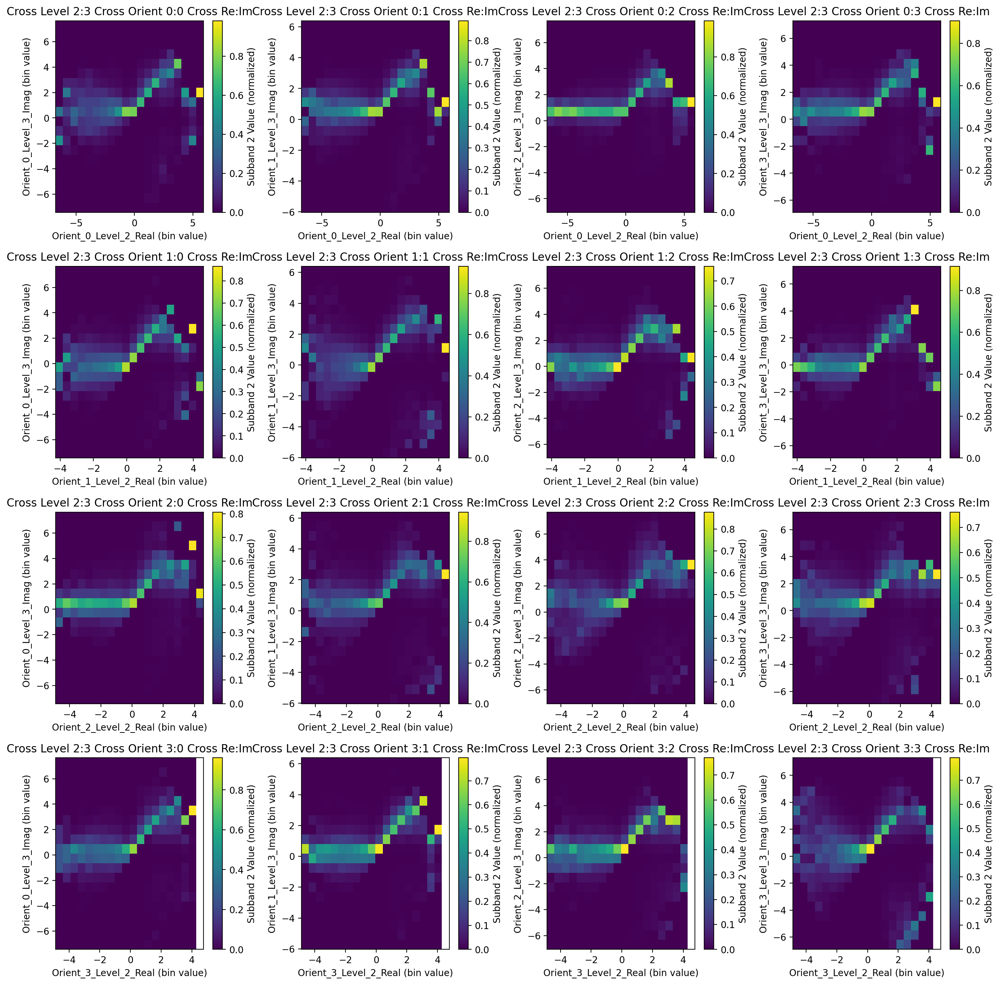

In [11]:
plt.clf()
imp.reload(ch)
#Real
for level1 in range(pyr_height-1):
    level2 = level1+1
    print(f'Levels {level1} x {level2} Real x Imaginary')
    plt.figure(figsize=(15,15))
    fignum=1
    for orient1 in range(num_orientations):
        for orient2 in range(num_orientations):
            subband1_list = []
            subband2_list = []
            band1_label=f'Orient_{orient1}_Level_{level1}_Real'
            band2_label=f'Orient_{orient2}_Level_{level2}_Imag'
            for img_pyr in pyrlist:
                #real x imag
                subband1_list.append(np.real(img_pyr.pyr_coeffs[(level1,orient1)]))
                subband2_list.append(np.imag(img_pyr.pyr_coeffs[(level2,orient2)]))
            plt.subplot(num_orientations, num_orientations, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list, 
                                                           nbins=20,
                                                           make_plot=True,
                                                           showfig=False,
                                                           band1_label=band1_label,
                                                           band2_label=band2_label,
                                                           title_label=f'Cross Level {level1}:{level2} Cross Orient {orient1}:{orient2} Cross Re:Im',
                                                           pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()


## Autocorrelation 7x7 Low Pass Reconstruction (P&S 2000 Stat)
"These characterize the salient spatial frequencies and the regularity (linear predictability) of the textures, as represented by periodic or globally oriented structures."

Residual Lowpass Autocorrelation
*************************************************

<Figure size 432x288 with 0 Axes>

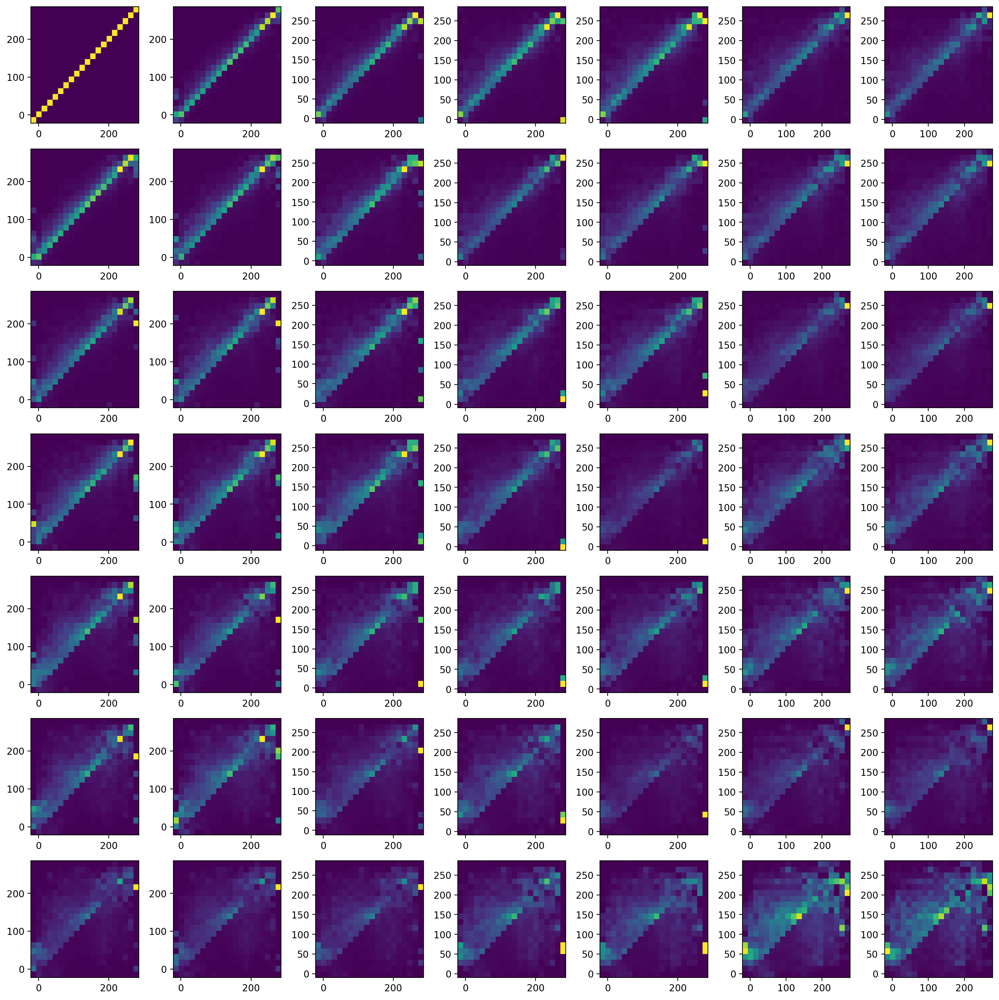

Level 0 Partial Reconstruction 3 Autocorrelation
*************************************************

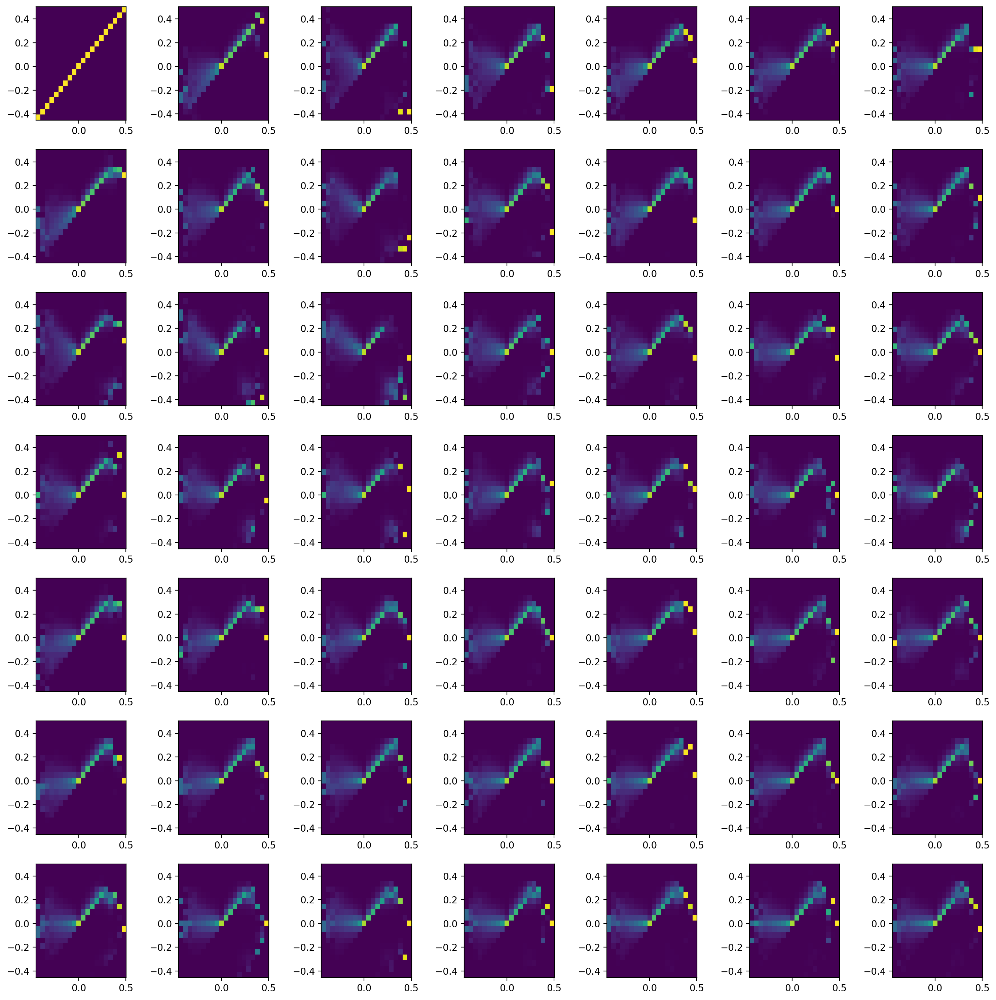

Level 1 Partial Reconstruction 3 Autocorrelation
*************************************************

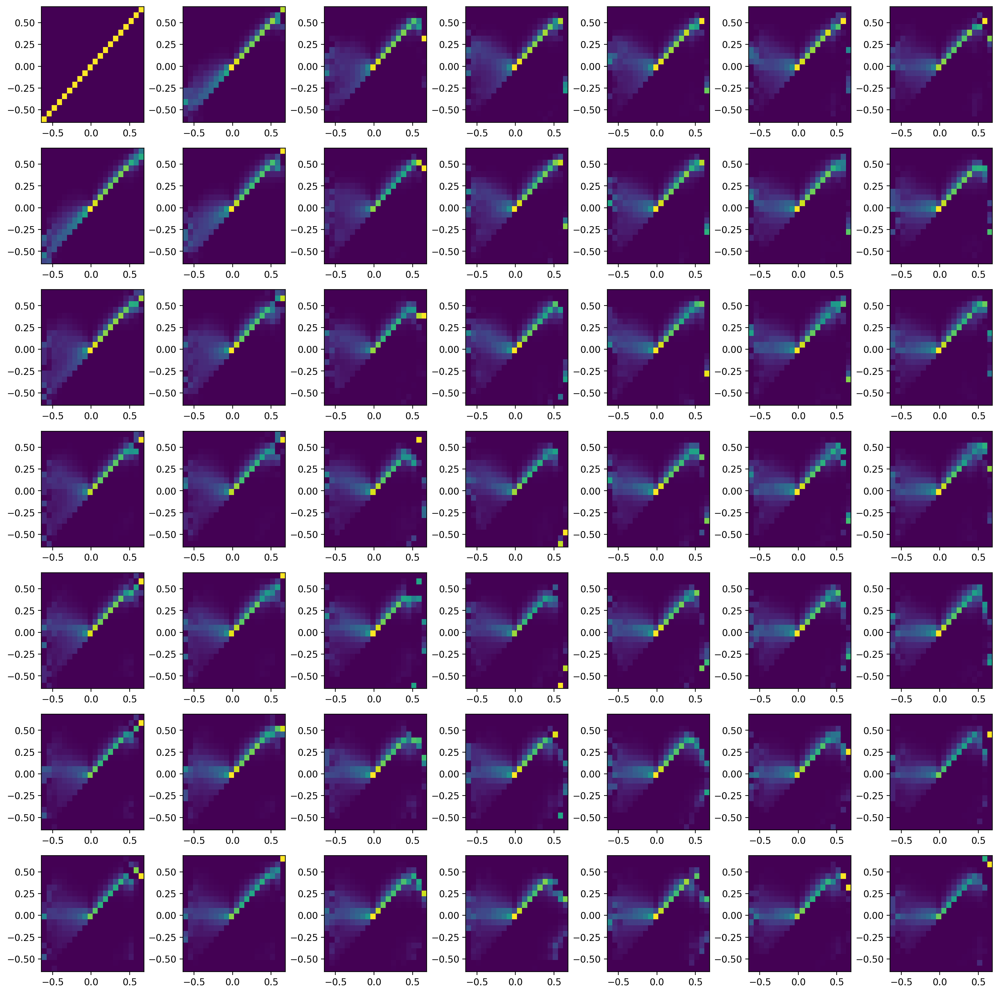

Level 2 Partial Reconstruction 3 Autocorrelation
*************************************************

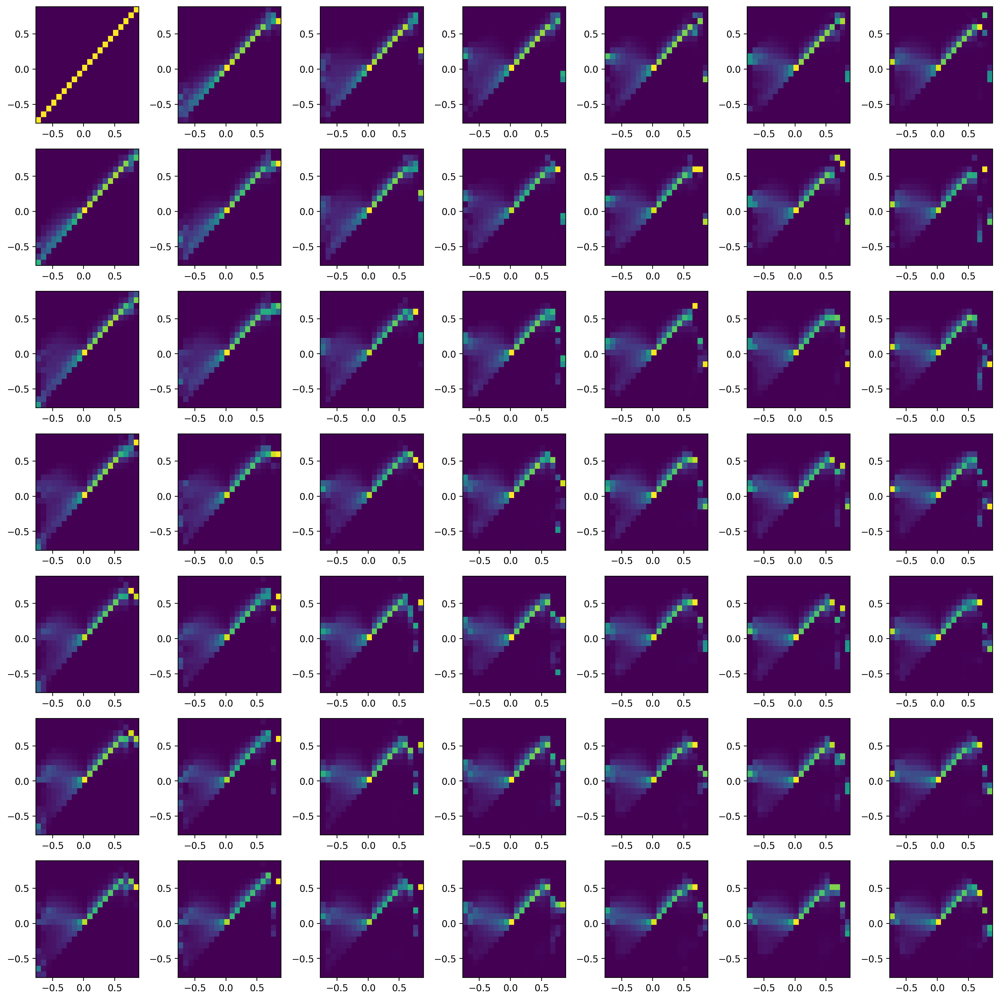

Level 3 Partial Reconstruction 3 Autocorrelation
*************************************************

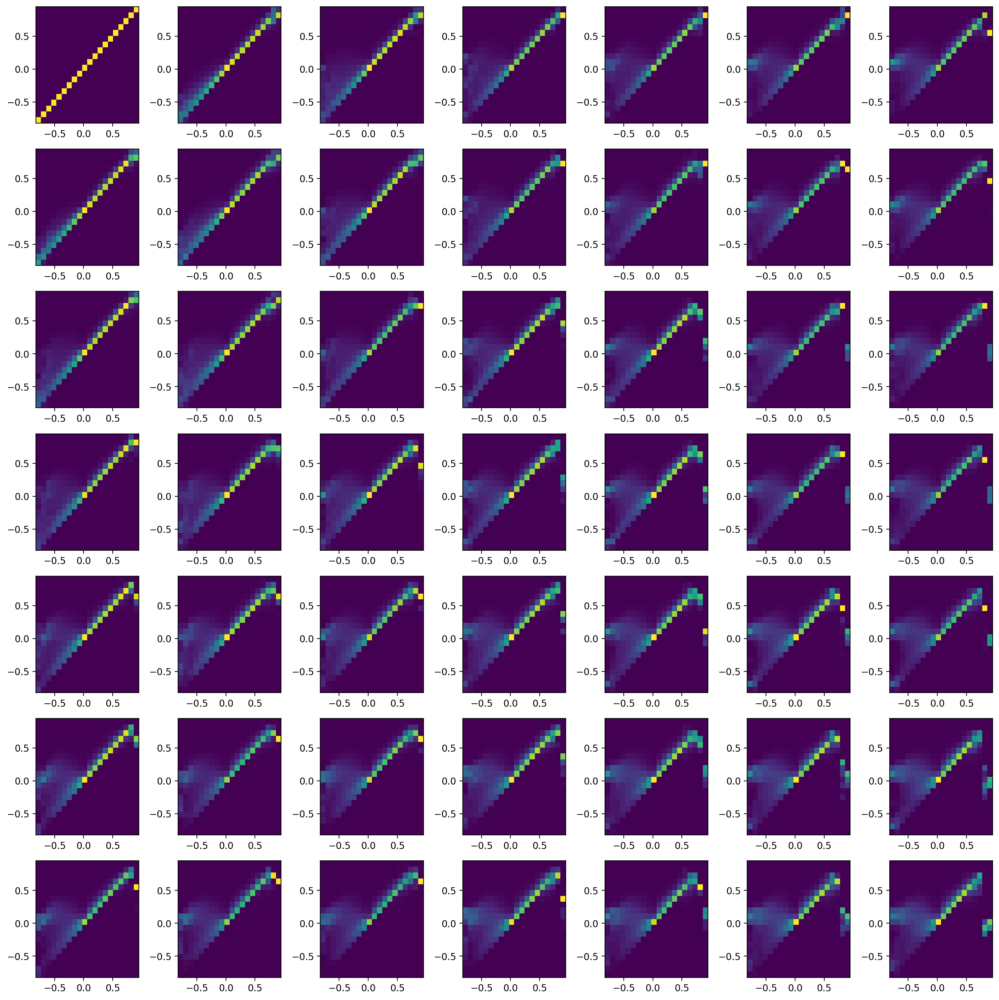

In [12]:
pixel_neighborhood = 7

plt.clf()
imp.reload(ch)        
# Partial Reconstruction

#first residual lowpass:
print(f'Residual Lowpass Autocorrelation')
plt.figure(figsize=(15,15))
fignum=1
for pixel_offset_x in range(pixel_neighborhood):
    for pixel_offset_y in range(pixel_neighborhood):
        subband1_list = []
        subband2_list = []
        for img_pyr in pyrlist:
            subband = img_pyr.pyr_coeffs['residual_lowpass']
            subband1_list.append(subband[:subband.shape[0]-pixel_offset_x,:subband.shape[1]-pixel_offset_y])
            subband2_list.append(subband[pixel_offset_x:,pixel_offset_y:])
        plt.subplot(pixel_neighborhood, pixel_neighborhood, fignum)
        butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                      make_plot=True, showfig=False,
                                                       show_labels=False,
                                                       title_label=f'O {orient}, L {level}, {(pixel_offset_x,pixel_offset_y)}',
                                                        show_cbar=False,
                                                       pdist_norm=True)
        fignum+=1
plt.tight_layout()
plt.show()

#now progressively higher levels
for level in range(pyr_height):
    print(f'Level {level} Partial Reconstruction {orient} Autocorrelation')
    plt.figure(figsize=(15,15))
    fignum=1
    for pixel_offset_x in range(pixel_neighborhood):
        for pixel_offset_y in range(pixel_neighborhood):
            subband1_list = []
            subband2_list = []
            for img_pyr in pyrlist:
                subband = img_pyr.recon_pyr(levels=range(level+1), bands='all')
                #crop based on offset
                subband1_list.append(subband[:subband.shape[0]-pixel_offset_x,:subband.shape[1]-pixel_offset_y])
                subband2_list.append(subband[pixel_offset_x:,pixel_offset_y:])
            plt.subplot(pixel_neighborhood, pixel_neighborhood, fignum)
            butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                          make_plot=True, showfig=False,
                                                           show_labels=False,
                                                           title_label=f'O {orient}, L {level}, {(pixel_offset_x,pixel_offset_y)}',
                                                            show_cbar=False,
                                                       pdist_norm=True)
            fignum+=1
    plt.tight_layout()
    plt.show()

### Autocorrelation 7x7 sample Magnitude (not a P&S stat)

Level 0 Orientation 0 Autocorrelation
*************************************************

<Figure size 432x288 with 0 Axes>

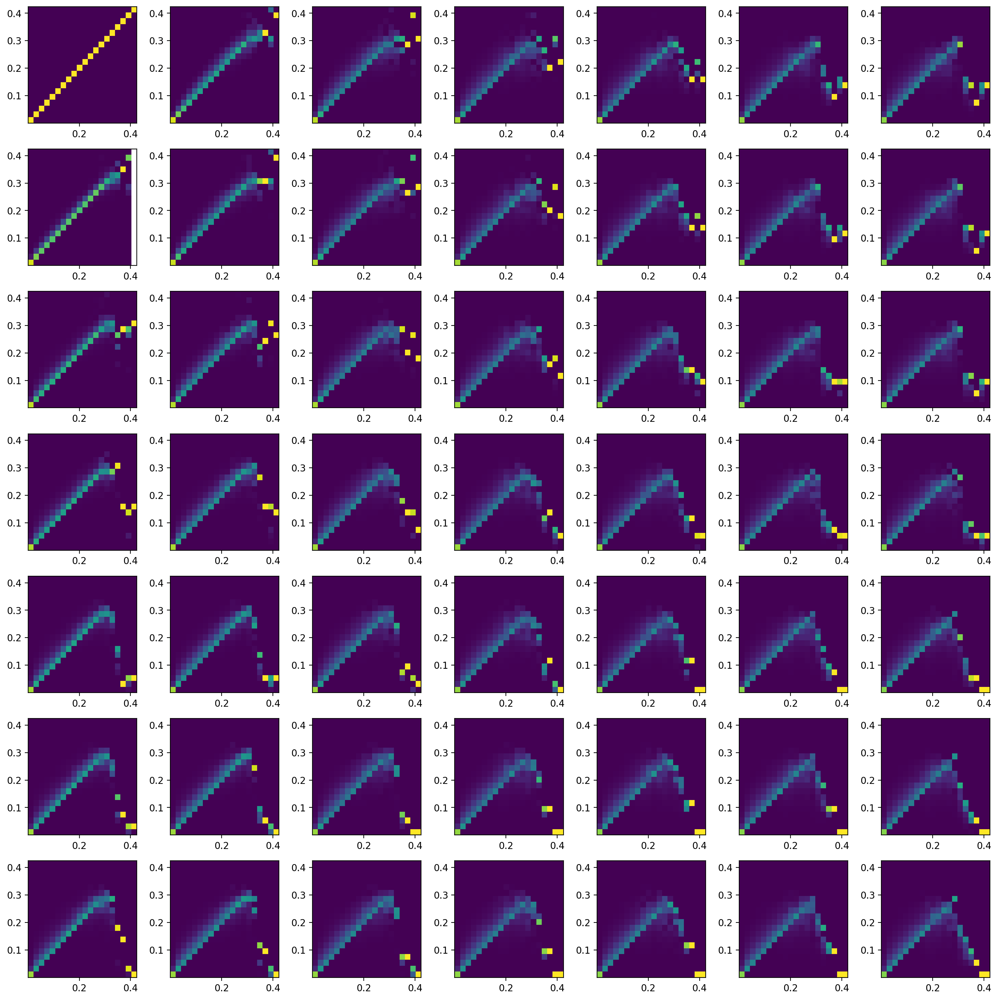

Level 1 Orientation 0 Autocorrelation
*************************************************

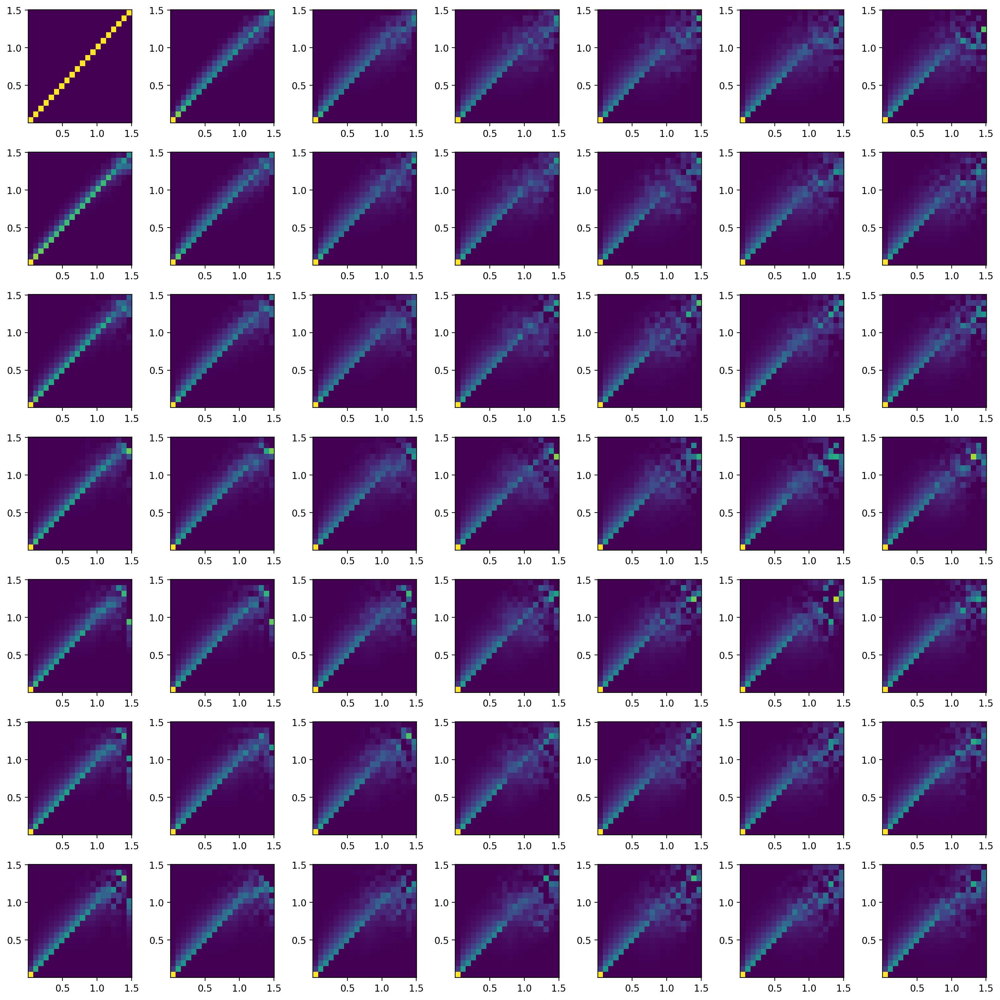

Level 2 Orientation 0 Autocorrelation
*************************************************

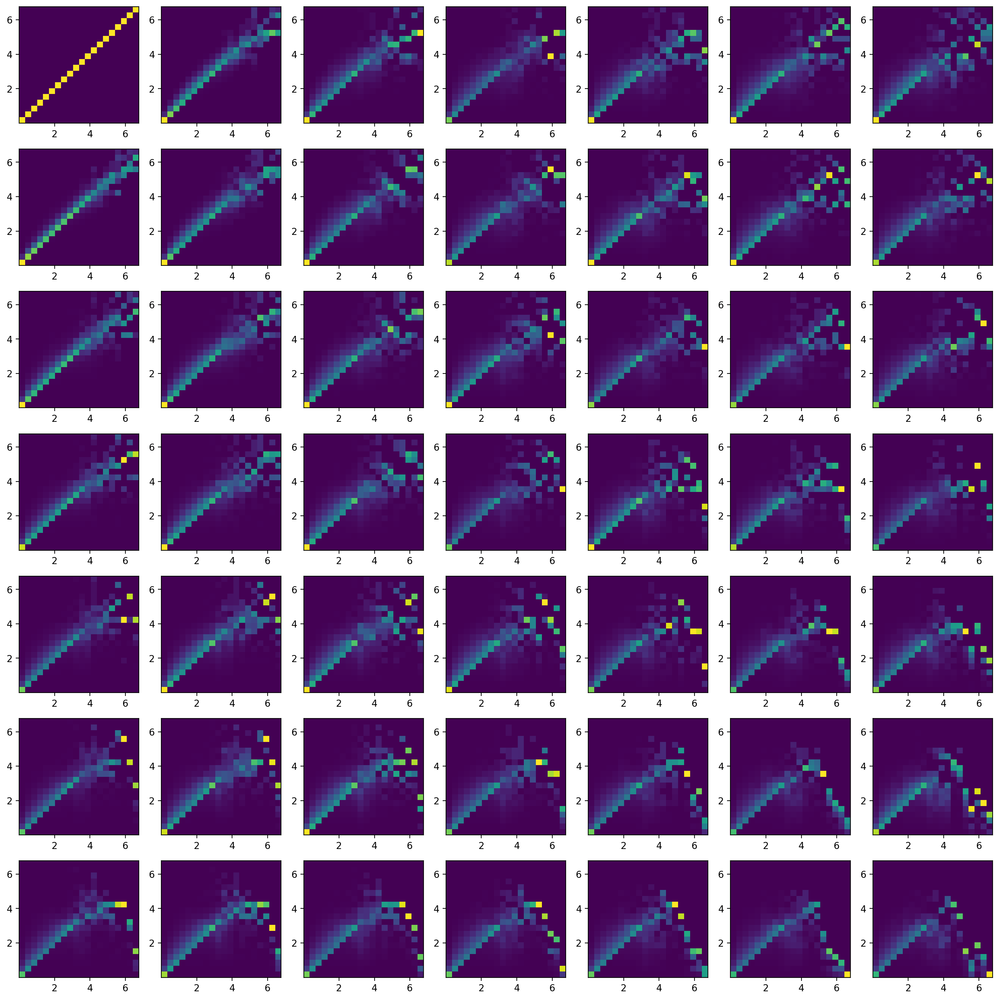

Level 3 Orientation 0 Autocorrelation
*************************************************

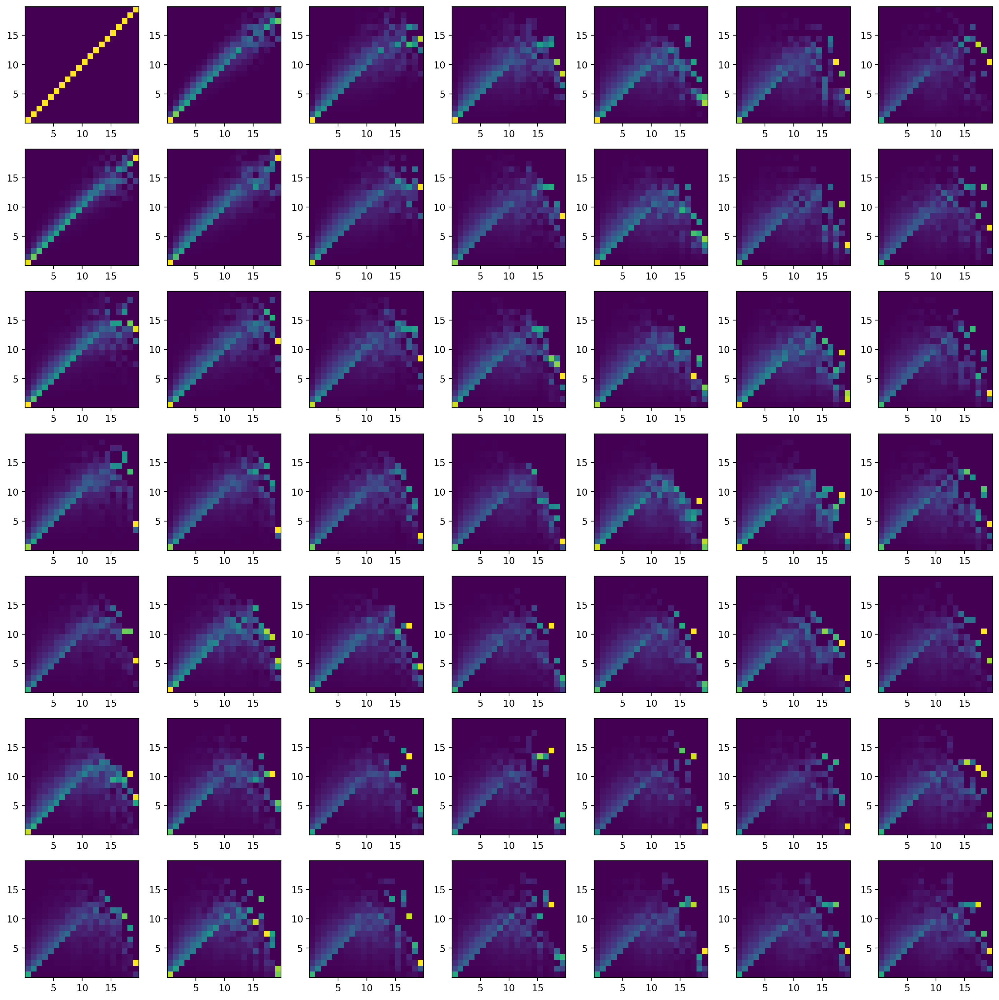

Level 0 Orientation 1 Autocorrelation
*************************************************

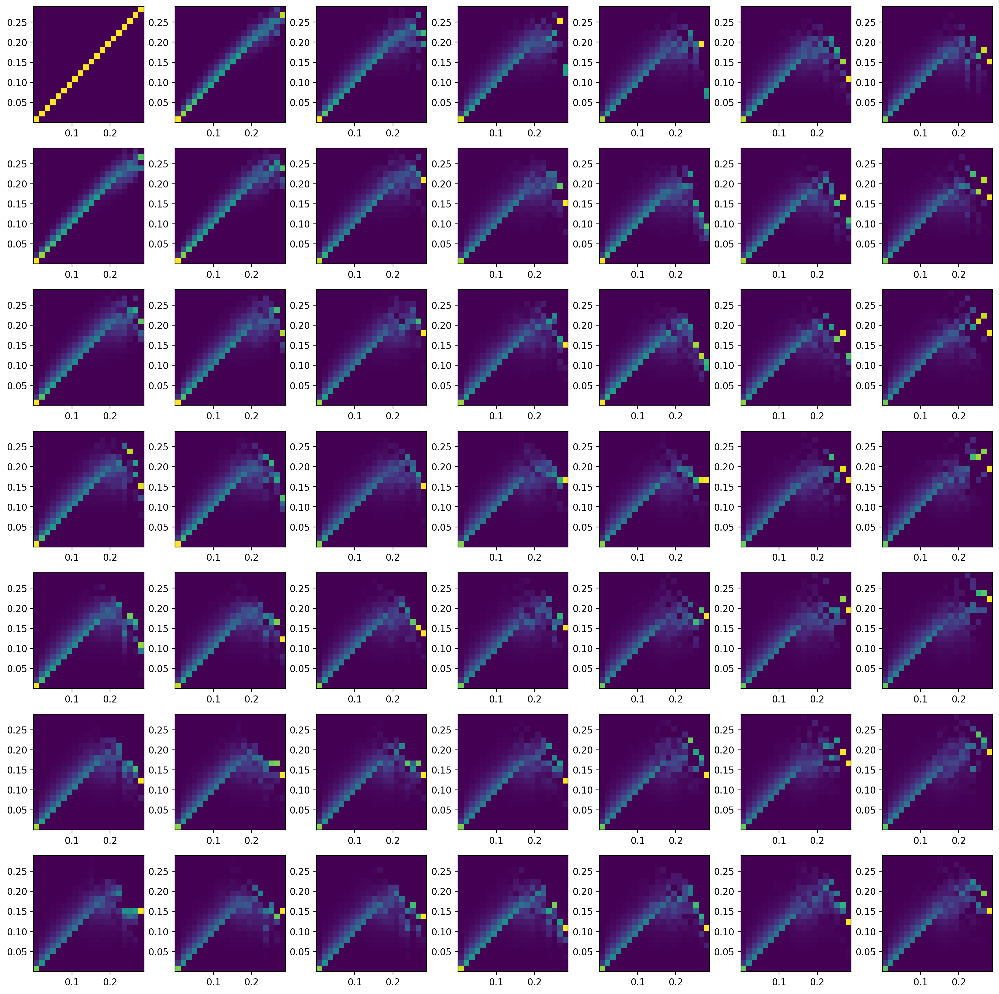

Level 1 Orientation 1 Autocorrelation
*************************************************

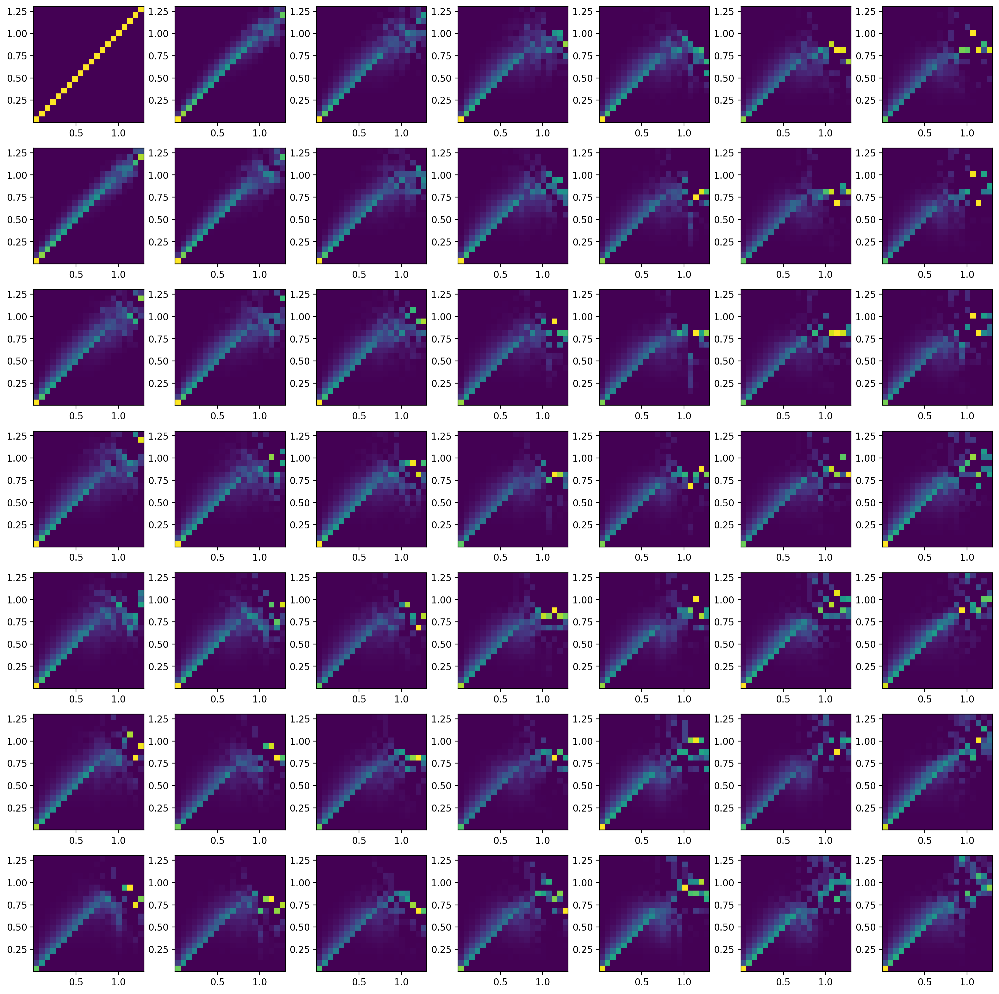

Level 2 Orientation 1 Autocorrelation
*************************************************

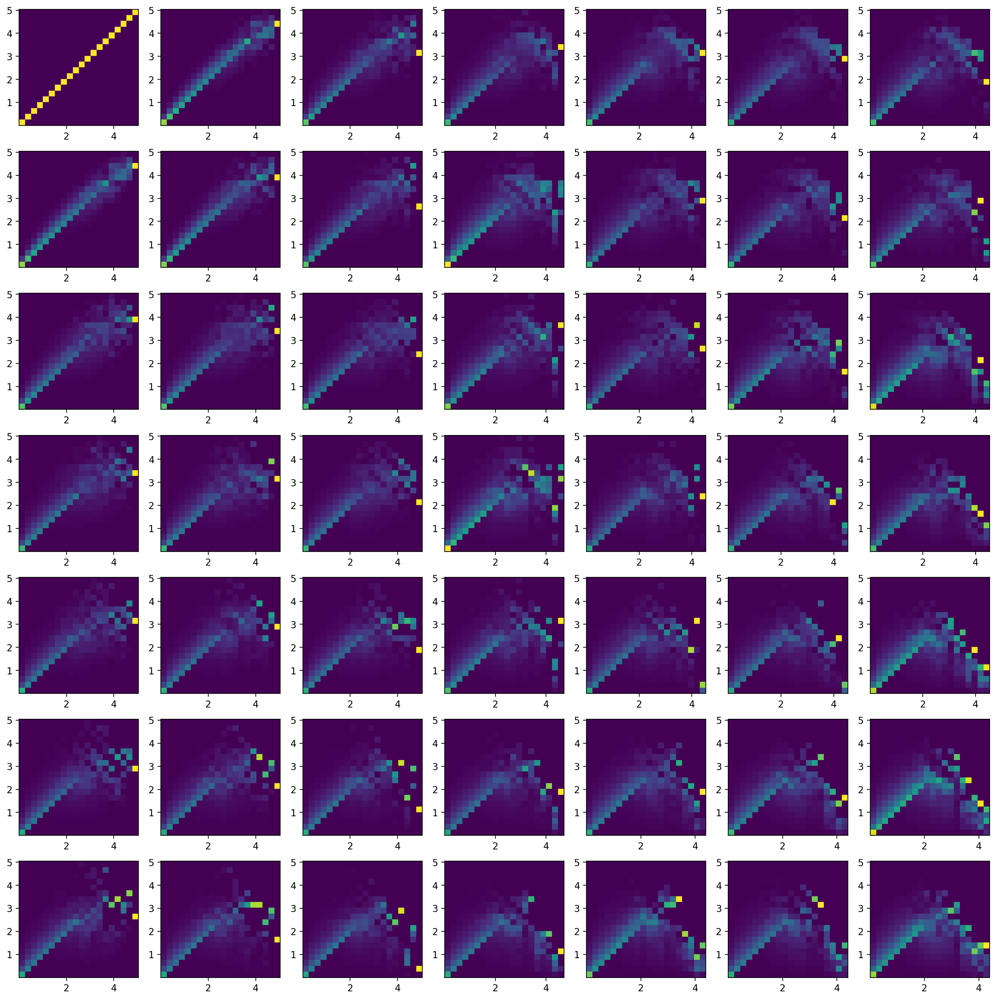

Level 3 Orientation 1 Autocorrelation
*************************************************

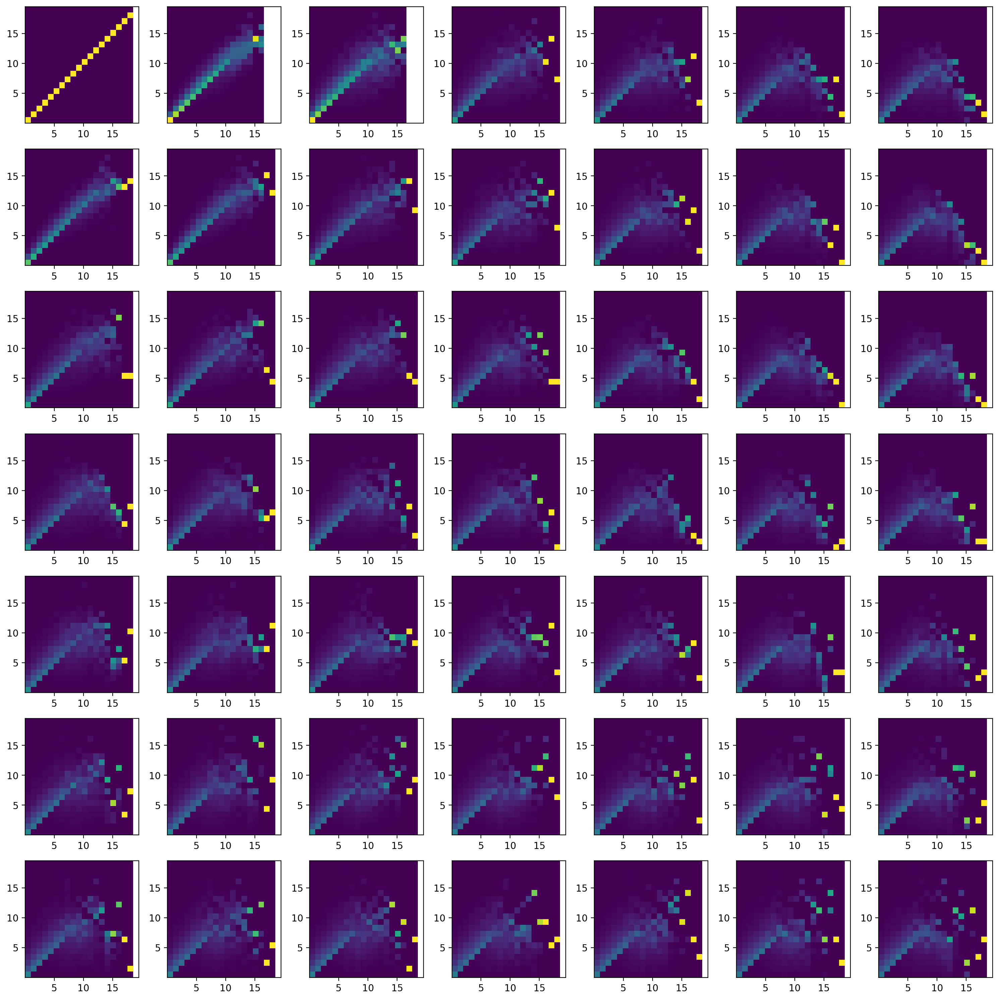

Level 0 Orientation 2 Autocorrelation
*************************************************

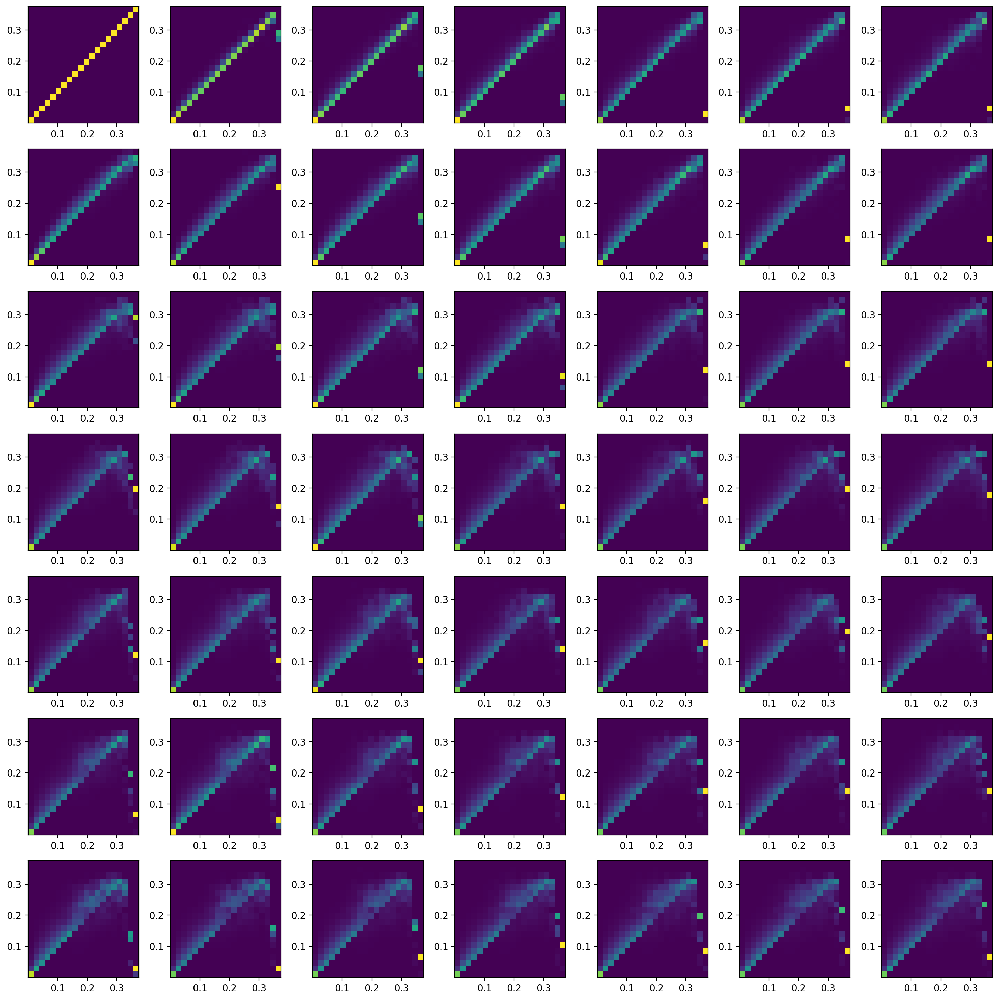

Level 1 Orientation 2 Autocorrelation
*************************************************

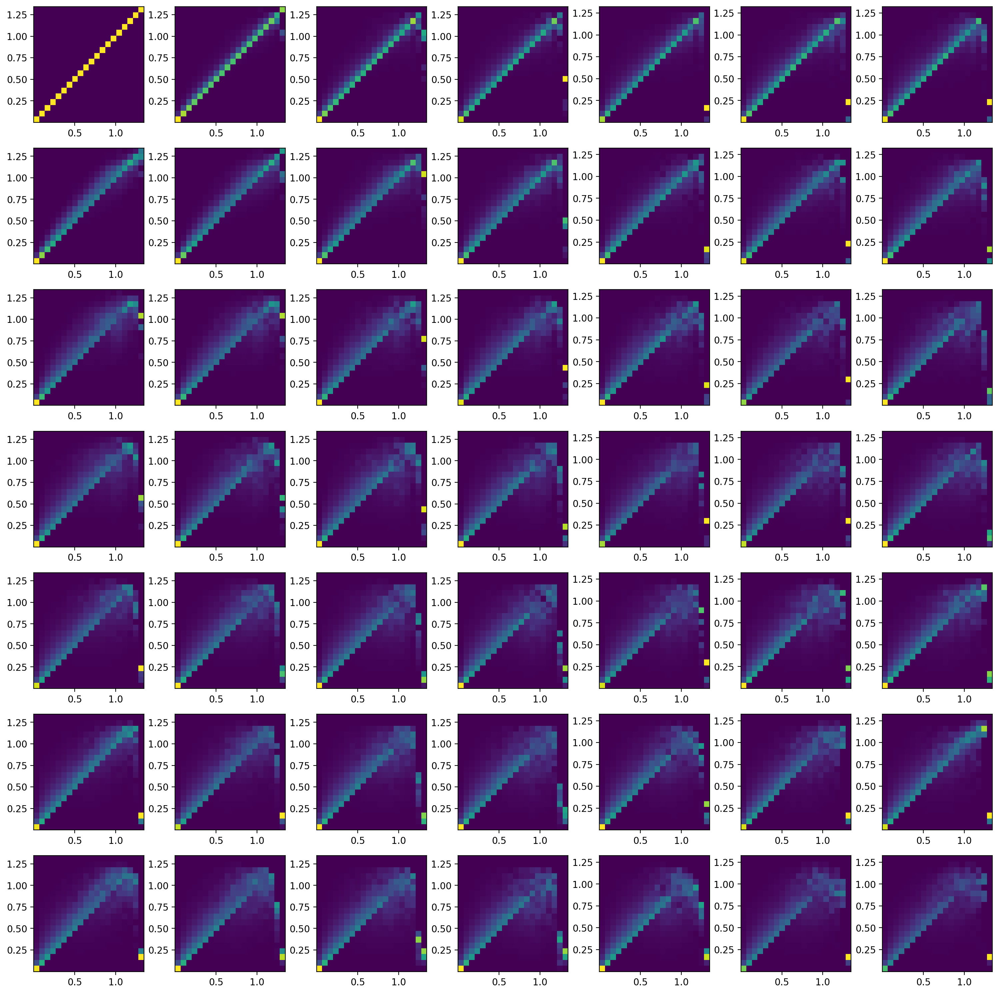

Level 2 Orientation 2 Autocorrelation
*************************************************

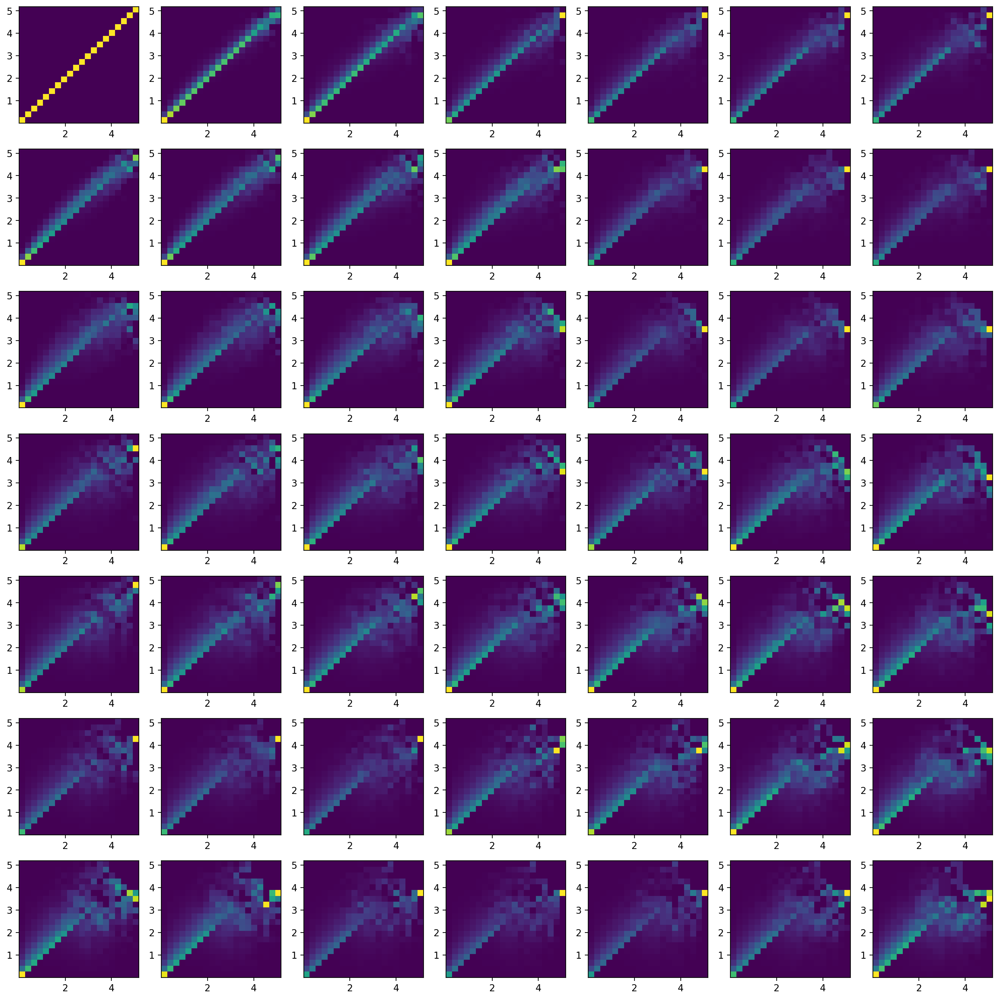

Level 3 Orientation 2 Autocorrelation
*************************************************

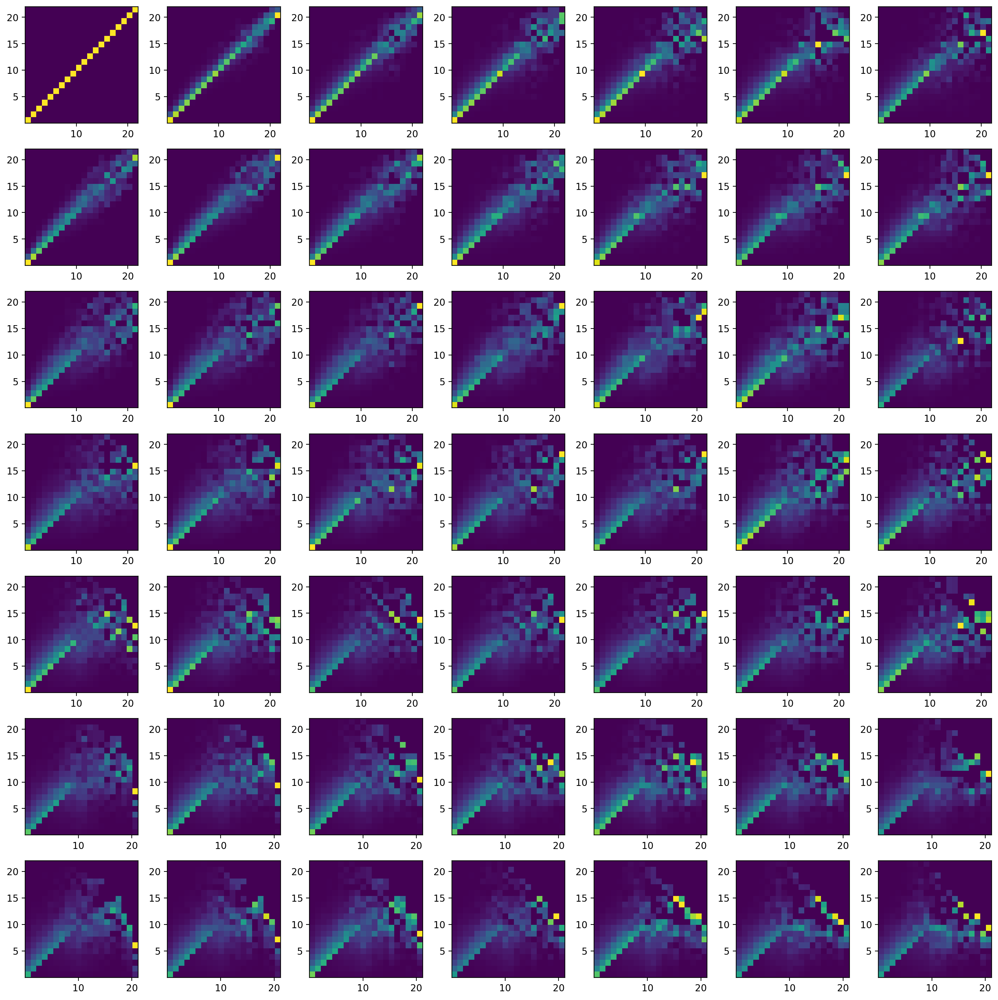

Level 0 Orientation 3 Autocorrelation
*************************************************

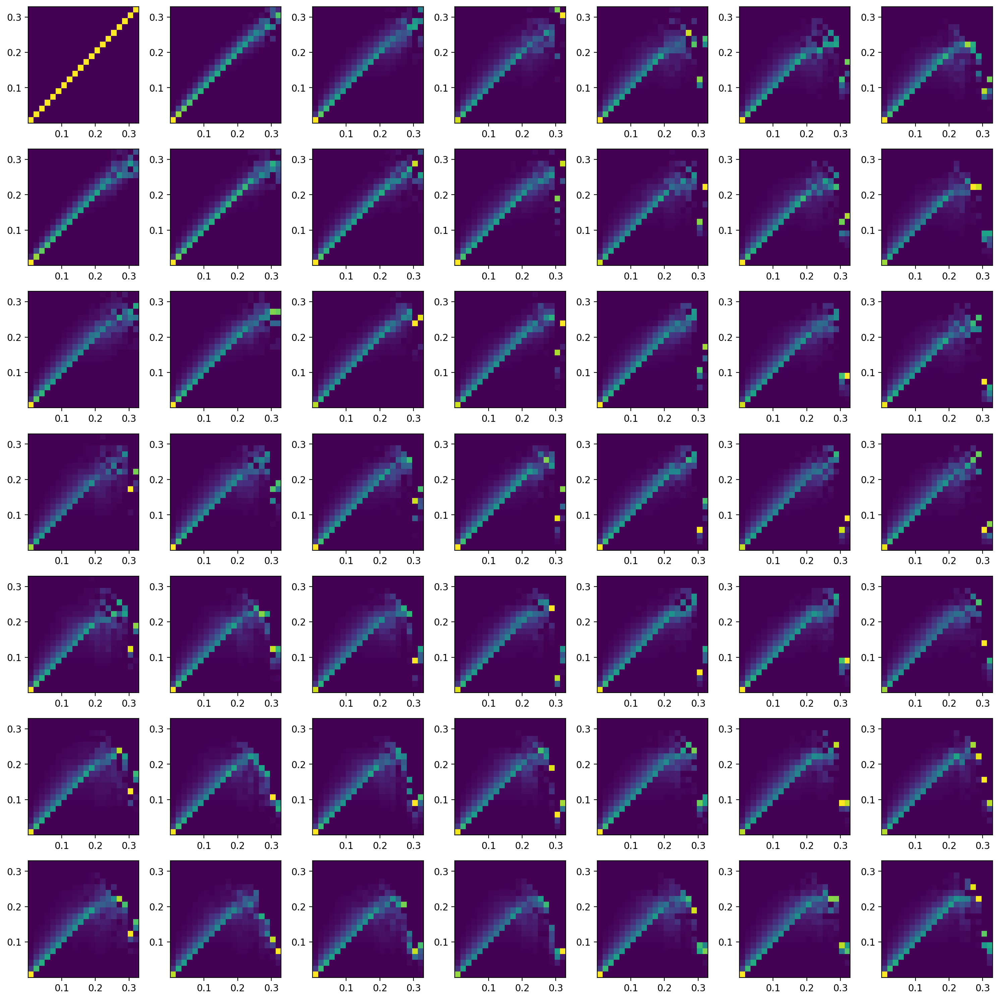

Level 1 Orientation 3 Autocorrelation
*************************************************

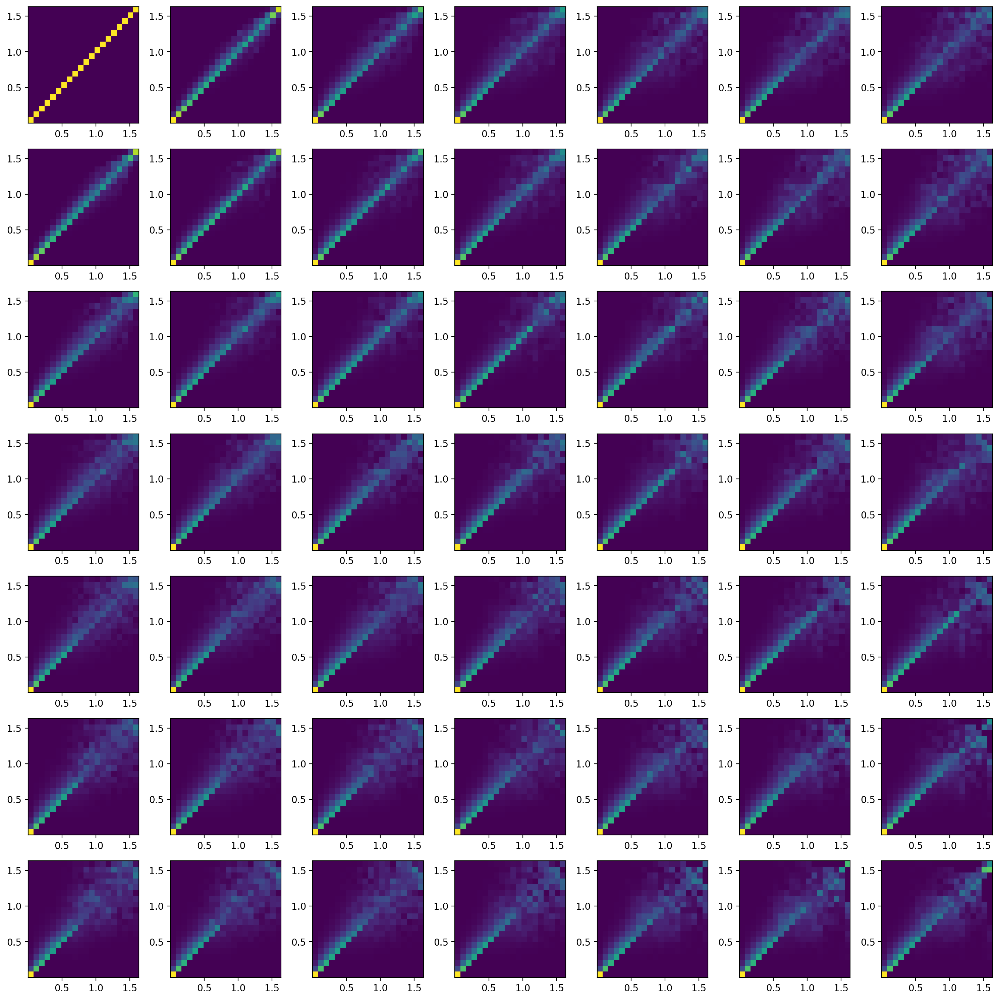

Level 2 Orientation 3 Autocorrelation
*************************************************

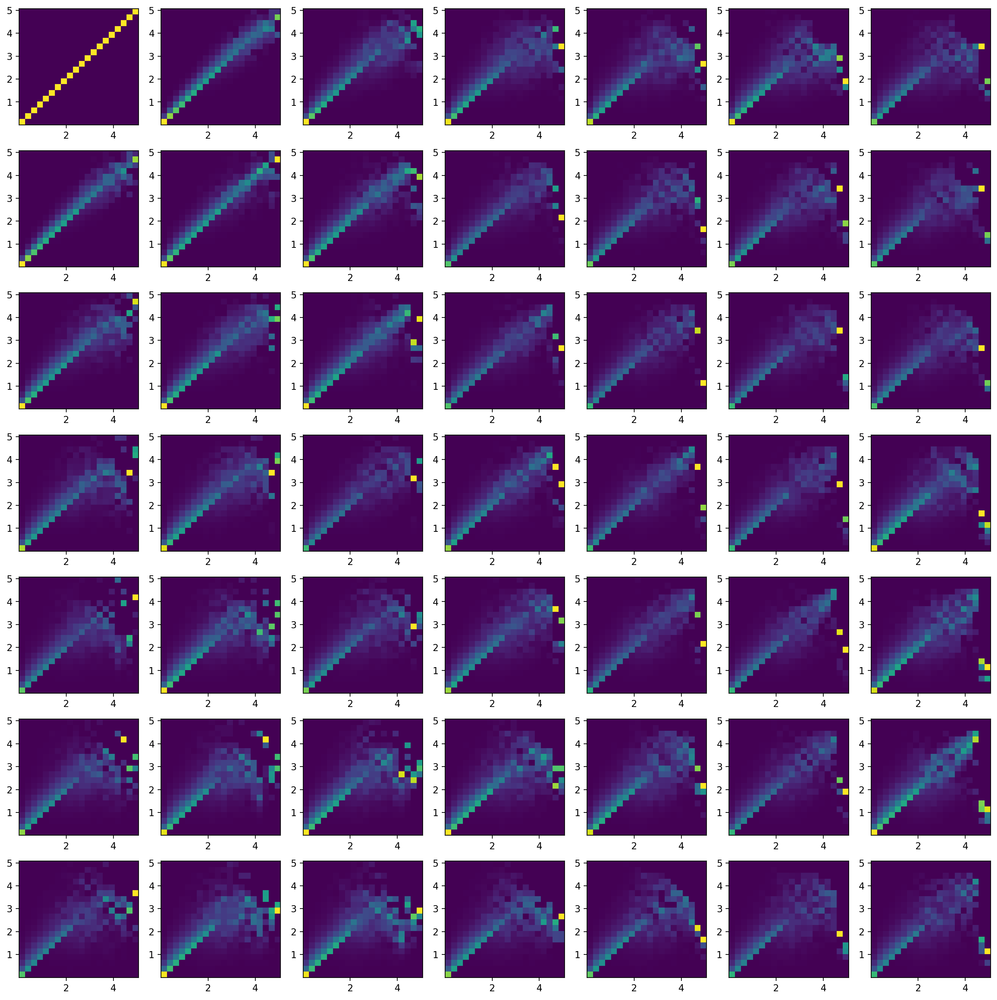

Level 3 Orientation 3 Autocorrelation
*************************************************

In [ ]:
pixel_neighborhood = 7

plt.clf()
imp.reload(ch)        
# #Magnitude
for orient in range(num_orientations):
    for level in range(pyr_height):
        print(f'Level {level} Orientation {orient} Autocorrelation')
        plt.figure(figsize=(15,15))
        fignum=1
        for pixel_offset_x in range(pixel_neighborhood):
            for pixel_offset_y in range(pixel_neighborhood):
                subband1_list = []
                subband2_list = []
                for img_pyr in pyrlist:
                    subband = np.abs(img_pyr.pyr_coeffs[(level,orient)])
                    #crop based on offset
                    subband1_list.append(subband[:subband.shape[0]-pixel_offset_x,:subband.shape[1]-pixel_offset_y])
                    subband2_list.append(subband[pixel_offset_x:,pixel_offset_y:])
                plt.subplot(pixel_neighborhood, pixel_neighborhood, fignum)
                butterfly_plot = ch.butterfly_conditional_avg(subband1_list, subband2_list,
                                                              make_plot=True, showfig=False,
                                                               show_labels=False,
                                                               title_label=f'O {orient}, L {level}, {(pixel_offset_x,pixel_offset_y)}',
                                                                show_cbar=False,
                                                       pdist_norm=True)
                fignum+=1
        plt.tight_layout()
        plt.show()